In [1]:
import numpy as np
import pandas as pd
import os
import cv2
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib.patches as patches
import random
from sklearn.utils import shuffle
from glob import glob
import seaborn as sns

import torch
import torchvision.models as models
from torchvision import datasets, transforms
from torch import optim
import torch.nn.functional as F
import torch.nn as nn
from torch.utils.data.sampler import SubsetRandomSampler
import random
from termcolor import colored
from sklearn.metrics import confusion_matrix
import itertools

from sklearn.model_selection import train_test_split
from tsne import bh_sne
import matplotlib.patches as patches
from PIL import Image

# 1. Image data EDA and quality control

In [2]:
base_dir = '/Volumes/Yuchen_Drive/Colorectal_histology_mnist/Kather_texture_2016_image_tiles_5000'

In [3]:
## Get labels of all classes in this dataset
img_labels = [i for i in os.listdir(base_dir) if not i.startswith('.')]
print('There are {} classes in this dataset:\n{}'.format(len(img_labels), img_labels))

There are 8 classes in this dataset:
['01_TUMOR', '02_STROMA', '03_COMPLEX', '04_LYMPHO', '05_DEBRIS', '06_MUCOSA', '07_ADIPOSE', '08_EMPTY']


In [4]:
tumor_files = glob(os.path.join(base_dir, img_labels[0], '*.tif'))
stroma_files = glob(os.path.join(base_dir, img_labels[1], '*.tif'))
complex_files = glob(os.path.join(base_dir, img_labels[2], '*.tif'))
lympho_files = glob(os.path.join(base_dir, img_labels[3], '*.tif'))
debris_files = glob(os.path.join(base_dir, img_labels[4], '*.tif'))
mucosa_files = glob(os.path.join(base_dir, img_labels[5], '*.tif'))
adipose_files = glob(os.path.join(base_dir, img_labels[6], '*.tif'))
empty_files = glob(os.path.join(base_dir, img_labels[7], '*.tif'))
img_files = [tumor_files, stroma_files, complex_files, lympho_files, debris_files, mucosa_files, adipose_files, empty_files]
total_files = [img for folder in img_files for img in folder]

In [5]:
print('Total number of images in this dataset: {}'.format(len(total_files)))
print ('-'*50)
for i in np.arange(8):
    print('Number of images for {} category: {}'.format(img_labels[i].split('_')[1], len(img_files[i])))

Total number of images in this dataset: 5000
--------------------------------------------------
Number of images for TUMOR category: 625
Number of images for STROMA category: 625
Number of images for COMPLEX category: 625
Number of images for LYMPHO category: 625
Number of images for DEBRIS category: 625
Number of images for MUCOSA category: 625
Number of images for ADIPOSE category: 625
Number of images for EMPTY category: 625


In [6]:
## OpenCV loads color images in BGR mode. For visualization by matplotlib, images need to be converted to RGB mode
def readImage_rgb(img_path):
    '''OpenCV loads color images in BGR mode and converts to RGB mode for visualization;
       output: (H x W x n_channel)'''
    img_bgr = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    return img_rgb

In [7]:
img = readImage_rgb(img_files[0][0])
print(img.shape)

(150, 150, 3)


### Short overview:
1. There are 5000 images evenly distributed in 8 classes with 625 images per class
2. multiclass classification
  * 0: `01_TUMOR` -- Tumour epithelium
  
  * 1: `02_STROMA` -- Simple stroma (homogeneous composition, includes tumour stroma, extra-tumoural stroma and smooth muscle)
  
  * 2: `03_COMPLEX` -- Complex stroma (containing single tumour cells and/or few immune cells)
  
  * 3: `04_LYMPHO` -- Immune cells (including immune-cell conglomerates and sub-mucosal lymphoid follicles)
  
  * 4: `05_DEBRIS` -- Debris (including necrosis, hemorrhage and mucus)
  
  * 5: `06_MUCOSA` -- Normal mucosal glands
  
  * 6: `07_ADIPOSE` -- Adipose tissue
  
  * 7: `08_EMPTY` -- Background (no tissue)

3. Image size is 150x150px, RGB mode

reference: https://www.nature.com/articles/srep27988

## 1.1 Visualize image files

First, we can view several images from each class

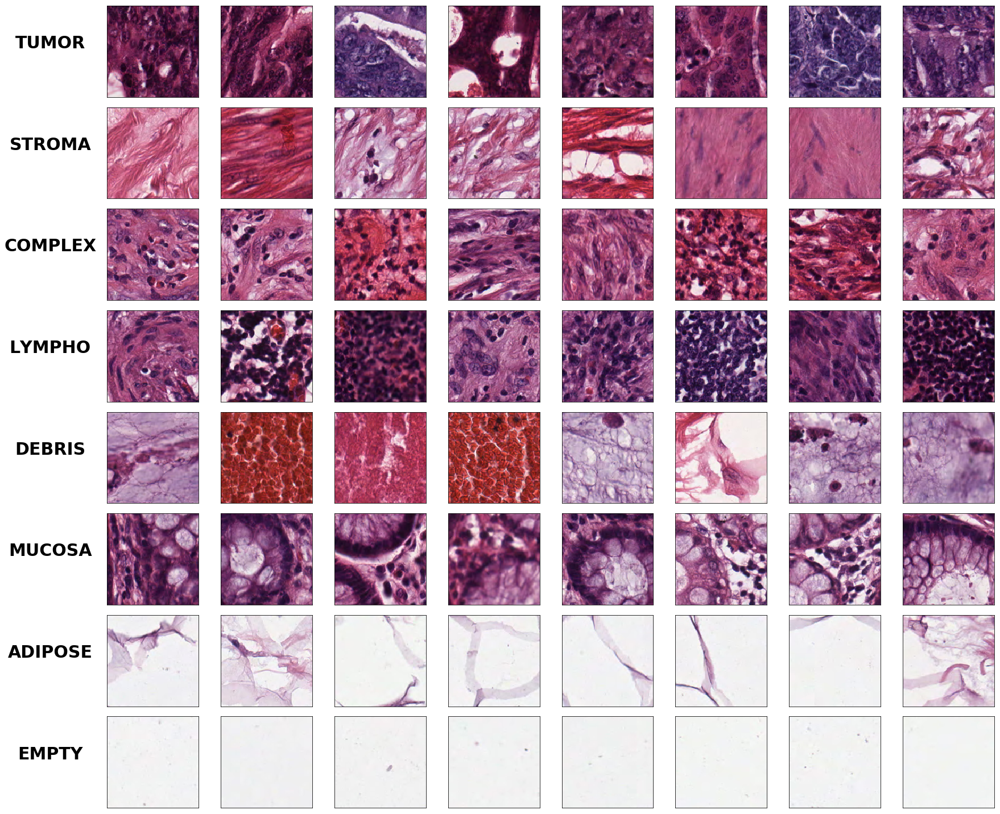

In [8]:
def plotImage_cat(img_files, img_labels):
    fig = plt.figure(figsize=(25,20))
    for i in np.arange(len(img_labels)):
        img_paths = img_files[i]
        img_label = img_labels[i]
        np.random.shuffle(img_paths)
        img_paths = img_paths[:8]
        for j, img_path in enumerate(img_paths):
            fig.add_subplot(8,8,i*8+j+1, xticks = [], yticks = [])
            plt.imshow(readImage_rgb(img_path))
            if j == 0:
                plt.ylabel(img_label.split('_')[1], rotation = 0, labelpad=100, fontsize=30, fontweight = 'bold')
    plt.tight_layout()    
    #fig.savefig('Histology.png')
plotImage_cat(img_files, img_labels)

Next, we can view individual image in each channel (RGB: red/green/blue) separately and in RGB mode

In [9]:
def plotImage_rgb(img_paths, img_label):
    '''Plot image in each of RGB (red/green/blue) channels separately and in RGB mode'''
    np.random.shuffle(img_paths)
    img_path = img_paths[0]
    img_rgb = readImage_rgb(img_path)
     
    fig = plt.figure(figsize=(20,8))
    channels = ['Red', 'Green', 'Blue']
    color = ['r','g','b']
    
    for idx in np.arange(3):
        plt.subplot(1,4,idx+1)
        img = img_rgb[:,:,idx]
        plt.imshow(img, cmap = 'gray')
        plt.title(channels[idx], color = color[idx], fontsize = 30)
        
    plt.subplot(1,4,4)
    plt.imshow(img_rgb)
    plt.title('RGB', fontsize = 30)
    fig.suptitle('H&E image of {} area'.format(img_label), fontsize = 36) 
    
    plt.tight_layout()

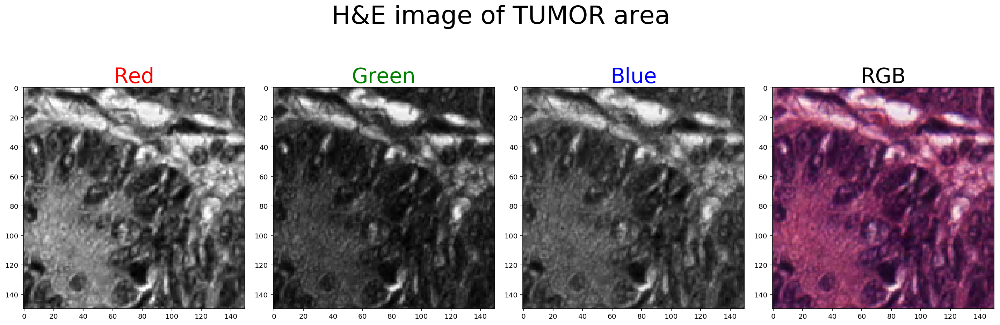

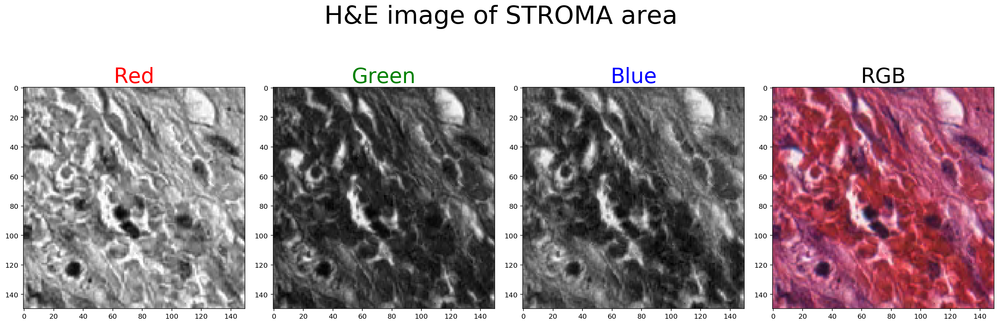

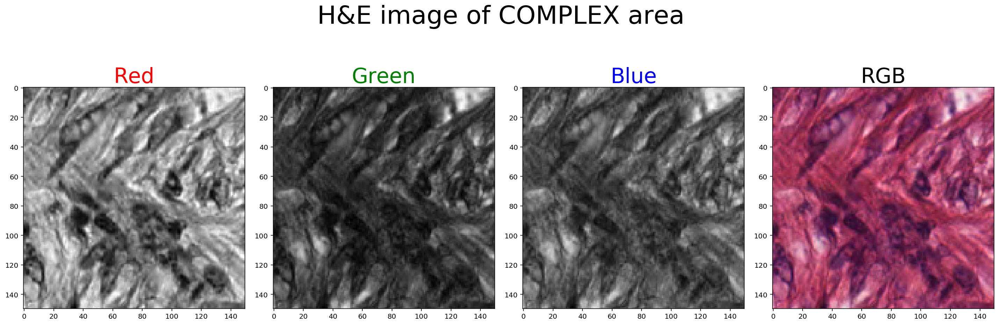

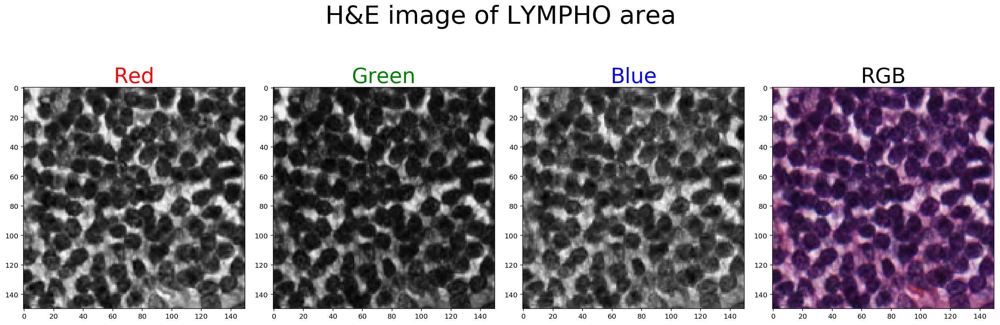

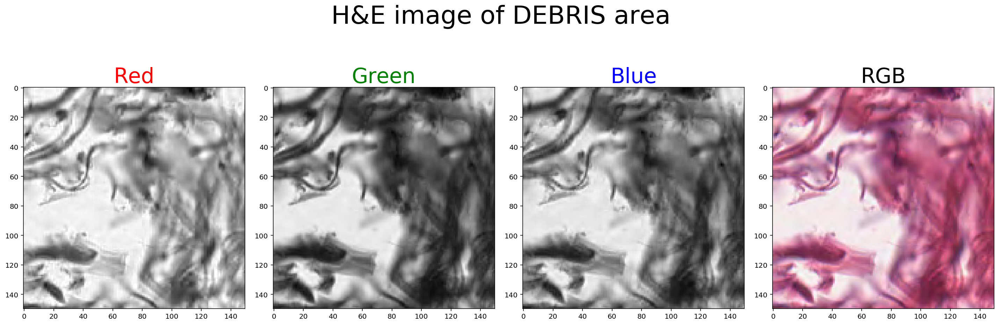

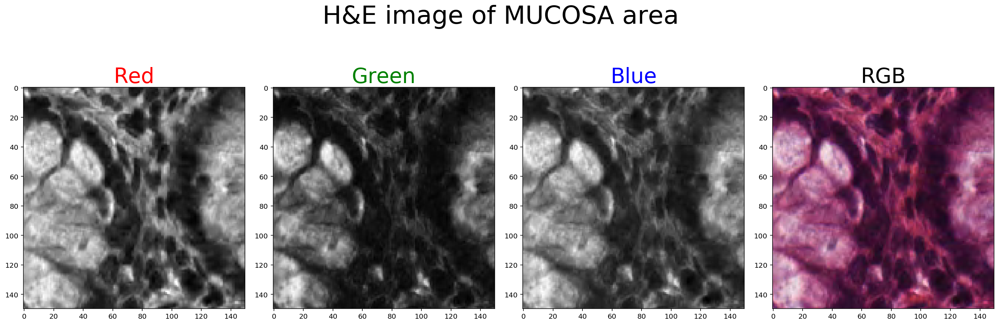

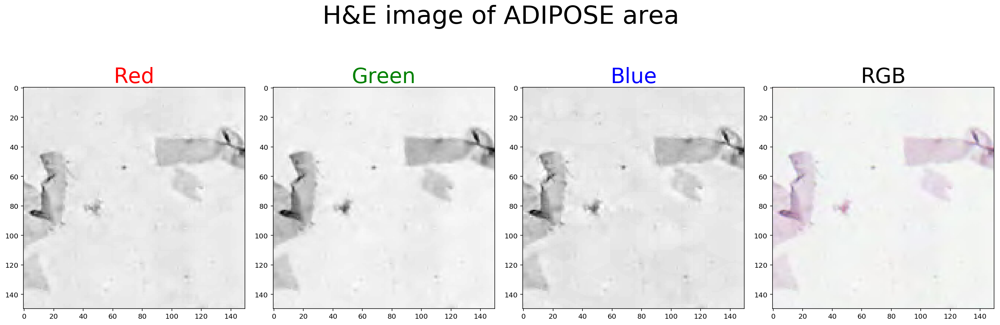

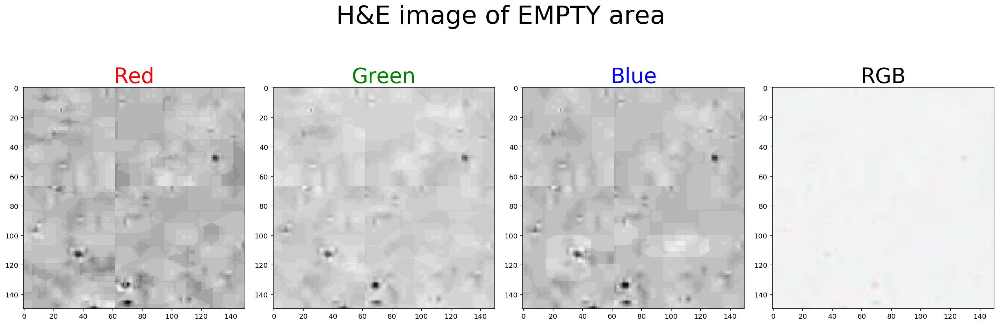

In [30]:
for i in np.arange(8):
    plotImage_rgb(img_files[i], img_labels[i].split('_')[1])

## 1.2 Basic image pixel statistics and quality control

### 1.2.1 Compute image intensity

Lower-order statistics such as the mean and variance of image pixel intensity can be used to describe texture. To analyze these statistics, the maximum, minimum, 0.1 quantile, 0.9 quantile, mean values and standard deviation of pixel intensity for each image is computed.

In [8]:
def image_summary(image_paths, img_label):
    img_dict = {}
    for i in range(len(image_paths)):
        img_path = image_paths[i]
        img_dict[img_path] = {}
        img = cv2.imread(img_path)
        img_dict[img_path]['label'] = img_label
        img_dict[img_path]['max'] = img.max()
        img_dict[img_path]['min'] = img.min()
        
        channel_mean = img.mean(axis = (0,1), keepdims = True).squeeze()
        channel_std = img.std(axis = (0,1), keepdims = True).squeeze()
        channel_q01 = np.quantile(img, 0.1, axis=(0,1), keepdims=True).squeeze()
        channel_q09 = np.quantile(img, 0.9, axis=(0,1), keepdims=True).squeeze()
        img_dict[img_path]['red_mean'], img_dict[img_path]['green_mean'], img_dict[img_path]['blue_mean'] = channel_mean
        img_dict[img_path]['red_std'], img_dict[img_path]['green_std'], img_dict[img_path]['blue_std'] = channel_std
        img_dict[img_path]['red_q01'], img_dict[img_path]['green_q01'], img_dict[img_path]['blue_q01'] = channel_q01
        img_dict[img_path]['red_q09'], img_dict[img_path]['green_q09'], img_dict[img_path]['blue_q09'] = channel_q09
        
    img_df = pd.DataFrame.from_dict(img_dict, orient = 'index')
    return img_df

In [9]:
tumor_files_df = image_summary(tumor_files, 'TUMOR')
stroma_files_df = image_summary(stroma_files, 'STROMA')
complex_files_df = image_summary(complex_files, 'COMPLEX')
lympho_files_df = image_summary(lympho_files, 'LYMPHO')
debris_files_df = image_summary(debris_files, 'DEBRIS')
mucosa_files_df = image_summary(mucosa_files, 'MUCOSA')
adipose_files_df = image_summary(adipose_files, 'ADIPOSE')
empty_files_df = image_summary(empty_files, 'EMPTY')

In [10]:
pixel_df = pd.concat([tumor_files_df, stroma_files_df, complex_files_df, lympho_files_df, debris_files_df, mucosa_files_df, adipose_files_df, empty_files_df])
pixel_df.shape

(5000, 15)

In [11]:
pixel_df.to_csv('Colorectal_histology_mnist_pixel_df.csv', index_label = 'img_id')
pixel_df = pd.read_csv('Colorectal_histology_mnist_pixel_df.csv', index_col = 'img_id')

In [12]:
pixel_df.head()

,label,max,min,red_mean,green_mean,blue_mean,red_std,green_std,blue_std,red_q01,green_q01,blue_q01,red_q09,green_q09,blue_q09
img_id,,,,,,,,,,,,,,,
/Volumes/Yuchen_Drive/Colorectal_histology_mnist/Kather_texture_2016_image_tiles_5000/01_TUMOR/10009_CRC-Prim-HE-03_009.tif_Row_301_Col_151.tif,TUMOR,255,3,93.070489,50.909022,109.519956,33.331296,35.534949,40.746317,59.0,21.0,61.0,132.0,86.0,161.0
/Volumes/Yuchen_Drive/Colorectal_histology_mnist/Kather_texture_2016_image_tiles_5000/01_TUMOR/10062_CRC-Prim-HE-02_003b.tif_Row_1_Col_301.tif,TUMOR,255,6,91.356178,40.800356,71.995689,23.784125,23.547030,29.012442,67.0,20.0,43.0,119.0,65.0,108.0
/Volumes/Yuchen_Drive/Colorectal_histology_mnist/Kather_texture_2016_image_tiles_5000/01_TUMOR/100B0_CRC-Prim-HE-09_009.tif_Row_1_Col_301.tif,TUMOR,253,0,105.176311,56.300622,110.024311,33.954839,37.985372,44.362337,69.0,20.0,54.0,149.0,102.0,168.0
/Volumes/Yuchen_Drive/Colorectal_histology_mnist/Kather_texture_2016_image_tiles_5000/01_TUMOR/10104_CRC-Prim-HE-10_021.tif_Row_451_Col_1.tif,TUMOR,255,0,82.178978,42.354978,112.731778,26.499503,25.609135,40.503191,53.0,17.0,62.0,117.0,74.0,168.0
/Volumes/Yuchen_Drive/Colorectal_histology_mnist/Kather_texture_2016_image_tiles_5000/01_TUMOR/10142_CRC-Prim-HE-09_025.tif_Row_151_Col_151.tif,TUMOR,255,5,108.705689,58.558889,104.122356,32.087160,35.506781,41.819073,74.0,25.0,56.0,153.0,106.0,163.0


In [14]:
pixel_df.describe()

,max,min,red_mean,green_mean,blue_mean,red_std,green_std,blue_std,red_q01,green_q01,blue_q01,red_q09,green_q09,blue_q09
count,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000
mean,253.738400,33.073000,149.021602,120.444890,165.724198,32.687364,37.394919,36.259577,111.733600,80.722960,120.485220,192.686980,170.245340,212.302240
std,4.755638,58.167228,57.698439,72.193794,51.263512,16.364589,19.016687,17.776395,69.682041,82.299805,70.133412,44.975819,61.050057,31.717389
min,190.000000,0.000000,38.260711,19.504400,53.743022,0.971972,0.888076,0.896202,17.000000,5.000000,24.000000,63.000000,31.000000,99.000000
25%,255.000000,2.000000,105.316689,64.500989,124.760700,23.477048,26.438023,25.983057,61.000000,21.000000,58.000000,156.750000,117.000000,192.750000
50%,255.000000,7.000000,131.465133,92.044844,160.190644,34.453753,38.824807,39.725139,82.000000,39.000000,104.000000,200.000000,174.000000,218.000000
75%,255.000000,27.000000,211.379856,197.407267,216.681911,44.985158,51.347413,49.031516,168.000000,134.000000,173.000000,241.000000,239.000000,243.000000
max,255.000000,234.000000,243.896844,244.455778,243.653289,84.855213,97.188613,81.882078,242.000000,243.000000,242.000000,247.000000,247.000000,248.000000


To check images with all pixel values very low (black)

In [15]:
img_dark = pixel_df[pixel_df['max'] < 30].index
print('Number of dark images: {}'.format(len(img_dark)))

Number of dark images: 0


To check images with all pixel values very high (bright)

In [16]:
img_bright = pixel_df[pixel_df['min'] > 225].index
print('Number of bright images: {}'.format(len(img_bright)))
img_bright_label = pixel_df[pixel_df['min'] > 225].label.value_counts().index.item()
print('bright images are from {} class'.format(img_bright_label))

Number of bright images: 21
bright images are from EMPTY class


There are no extremely dark images. Although there are 21 bright images, all of them are from `EMPTY` class which is reasonable as these images generally have a bright field with high intensity values. All images pass the quanlity control.

### 1.2.2 Compare average pixel intensity distribution for each class of images

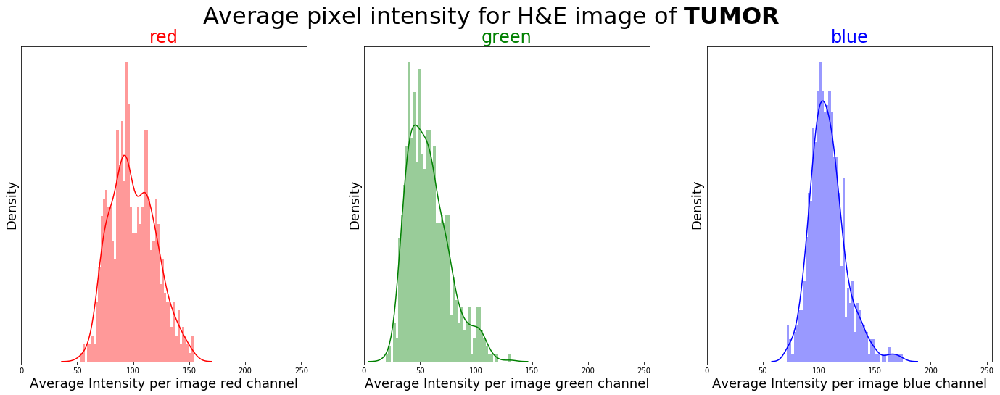

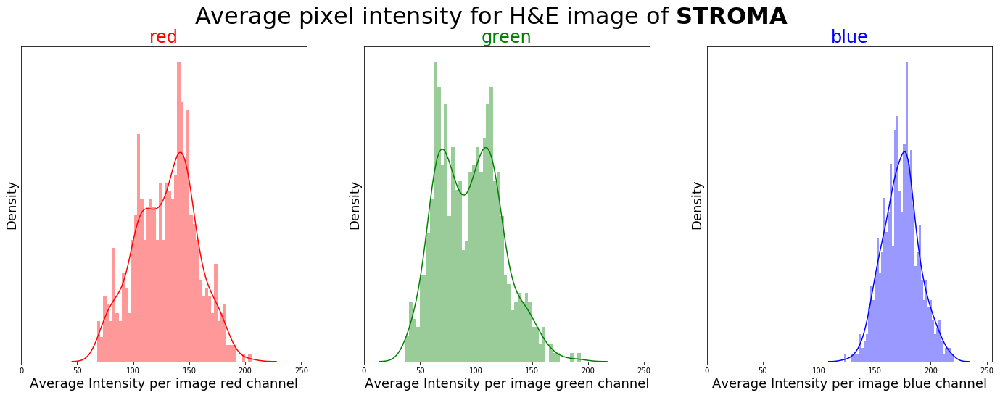

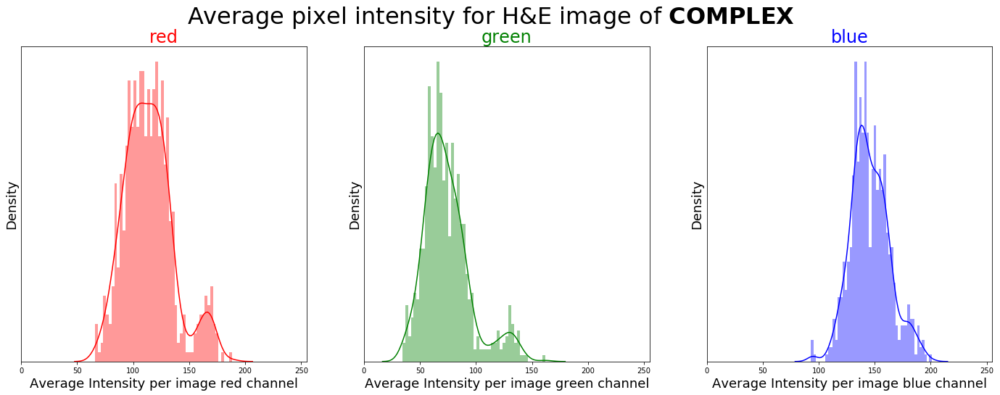

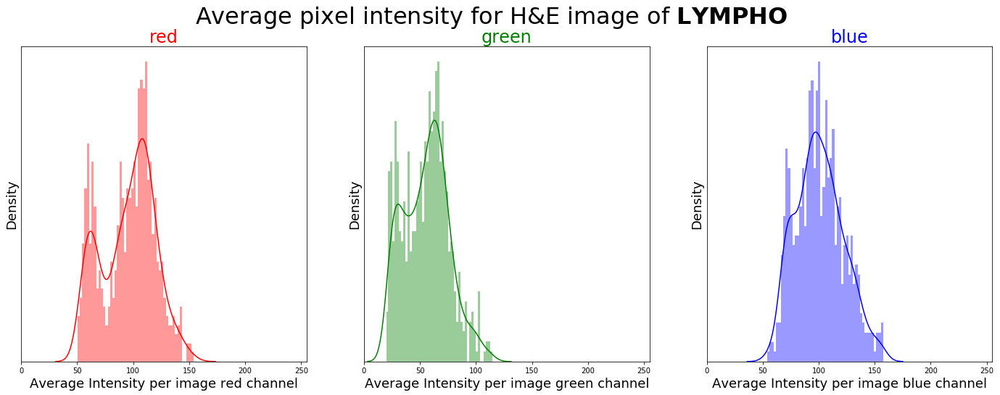

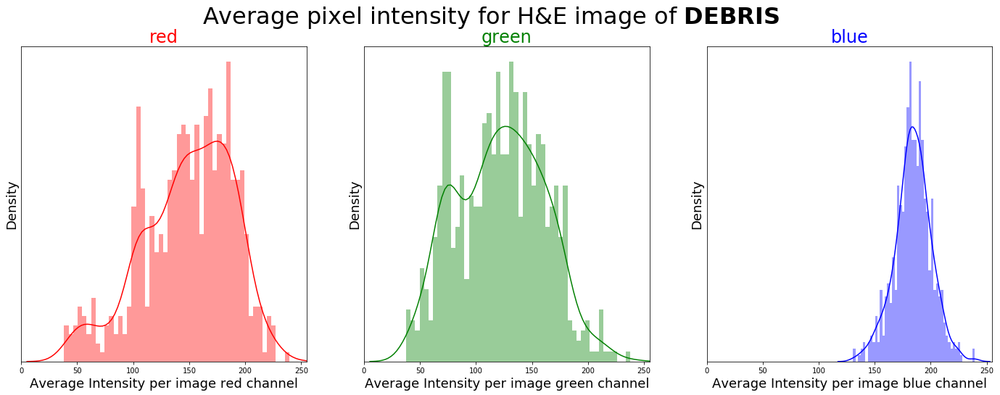

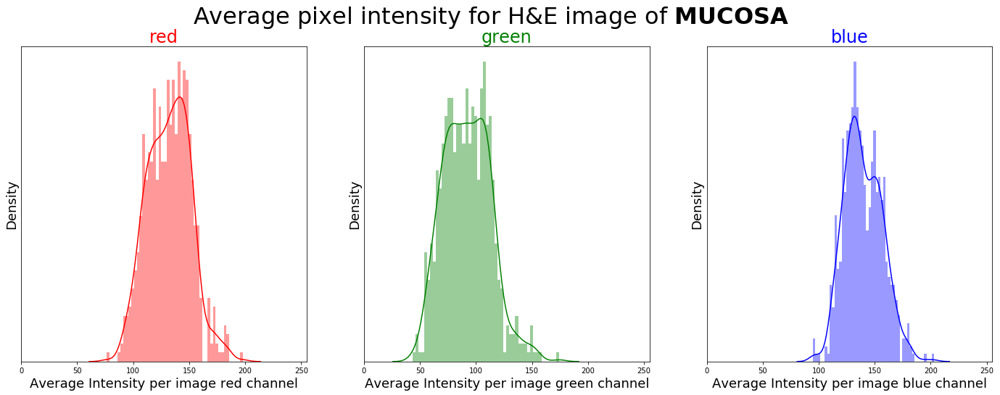

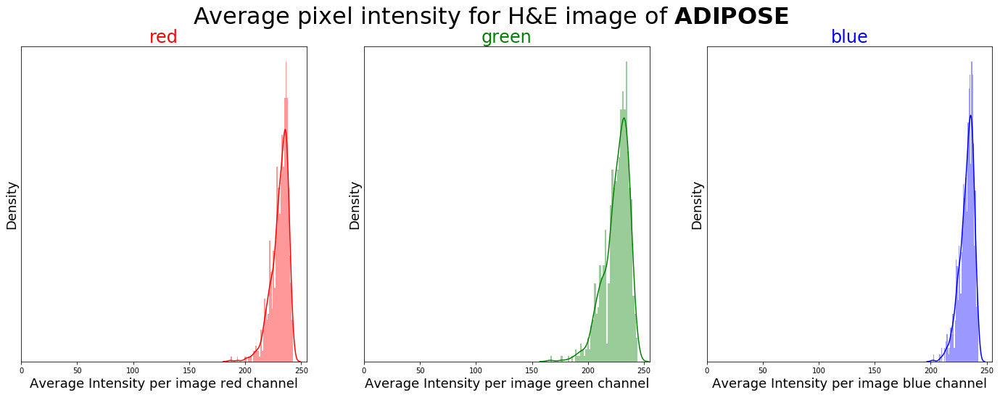

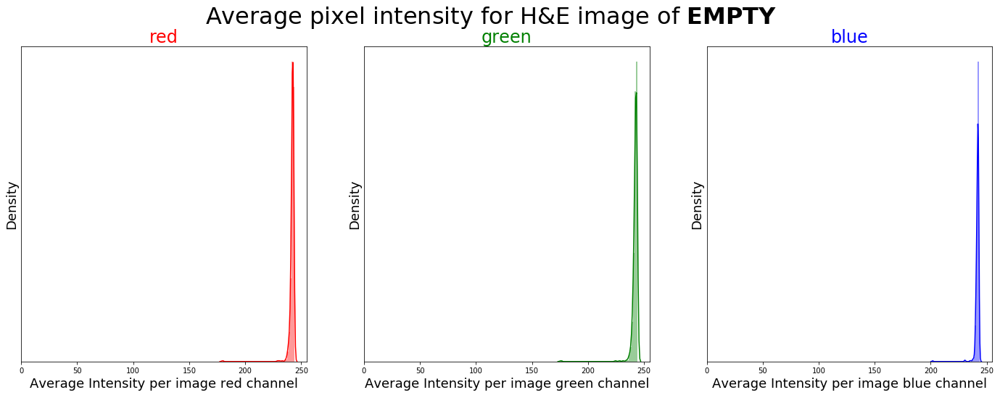

In [18]:
def plotPixel_average(img_label):
    col = ['red', 'green', 'blue']
    col_mean = ['red_mean', 'green_mean', 'blue_mean']
    fig, ax = plt.subplots(1,3,figsize=(24,8))
    for i in np.arange(3):
        sns.distplot(pixel_df[pixel_df.label == img_label][col_mean[i]], bins = 50, color=col[i], ax = ax[i])
        ax[i].set_title(col[i], color=col[i], fontsize=24)
        ax[i].set_xlabel('Average Intensity per image {} channel'.format(col[i]), fontsize=18)
        ax[i].set_ylabel('Density', fontsize=18)
        ax[i].set_xlim(0,255)
        ax[i].set_yticks([])
    fig.suptitle("Average pixel intensity for H&E image of " + r"$\bf{" + str(img_label) + "}$", fontsize = 32)

for i in np.arange(8):
    plotPixel_average(img_labels[i].split('_')[1])

`ADIPOSE` and `EMPTY` classes have very distinct intensity distributions. To better compare the pixel intensity of the other 6 classes, the pixel density distributions of each class is combined and plot in one graph as shown below. 

Text(0.5, 0.98, 'Average pixel intensity distributions for TUMOR, STROMA, COMPLEX, LYMPHO, DEBRIS and MUCOSA')

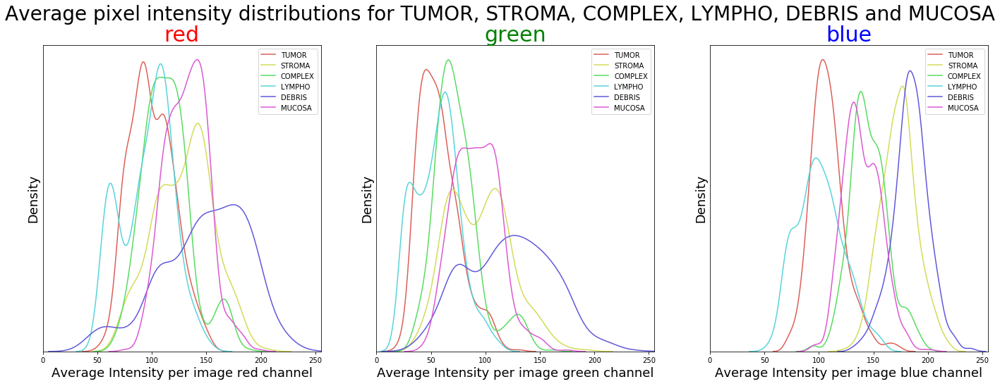

In [20]:
#color = ['#99bbff', '#ff9999', '#ff9900', '#59b300', '#99ff99', '#cc99ff']
palette = sns.color_palette('hls', 6)
col = ['red', 'green', 'blue']
col_mean = ['red_mean', 'green_mean', 'blue_mean']
fig, ax = plt.subplots(1,3, figsize=(24,8))
for i in np.arange(3):
    for j in np.arange(6):
        label = img_labels[j].split('_')[1]
        sns.distplot(pixel_df[pixel_df.label == label][col_mean[i]], hist = False, bins=50, color = palette[j], label = label, ax = ax[i])
    ax[i].set_title(col[i], color = col[i], fontsize=30)
    ax[i].set_xlabel('Average Intensity per image {} channel'.format(col[i]), fontsize=18)
    ax[i].set_ylabel('Density', fontsize=18)
    ax[i].set_xlim(0,255)
    ax[i].set_yticks([])
    ax[i].legend()
fig.suptitle('Average pixel intensity distributions for TUMOR, STROMA, COMPLEX, LYMPHO, DEBRIS and MUCOSA', fontsize=28)

Average staining intensity showed large variation across different sample classes. 
* The `EMPTY` class has a sharp high intensity peak, consistent with the notion of 'empty' region. 
* The `ADIPOSE` class has a similar intensity distribution to `EMPTY` class. This is due to the fact that cells in adipose tissue are accumulated with fat/lipid in the cytoplasm. The fat is dissolved during H&E staining and give the cells an 'empty' appearance. Due to the existence of the remaining cytoplasm and nucleus, the intensity shows a wider distribution compared to `EMPTY` class, but the overall intensity is much brighter and homogeneous compared to the other classes.
* The `DEBRIS` class exhibits very broad intensity distribution in both Red and Green channels, consistent with high heterogeneity of debris. However, it has a very high intensity with normal distribution in blue channel compared to the majority of the other classes. 
* Each class type has a distinct intensity distribution pattern which may provide additional insight into image classification and help improve the prediction accuracy.

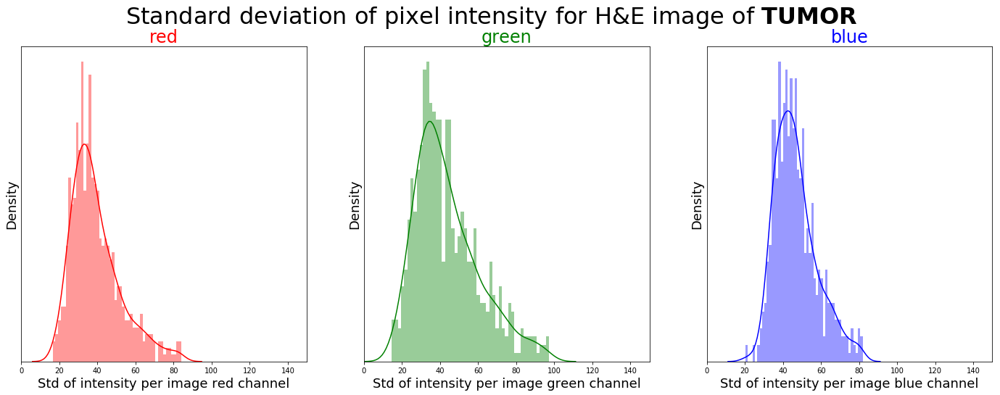

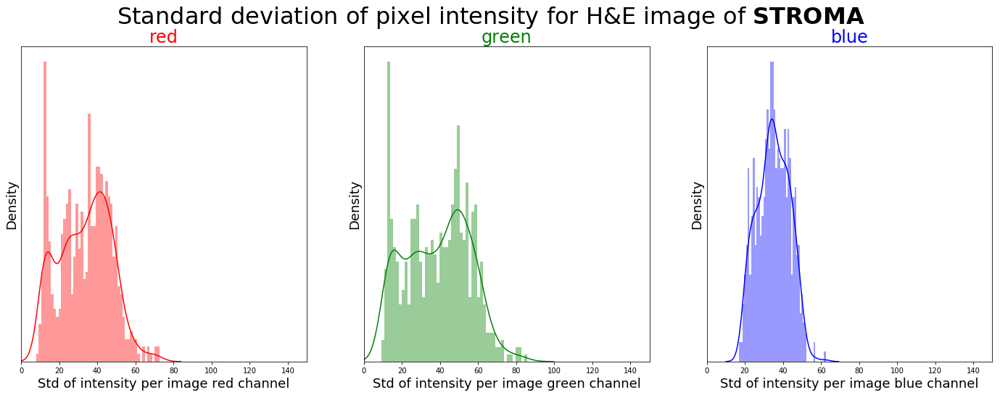

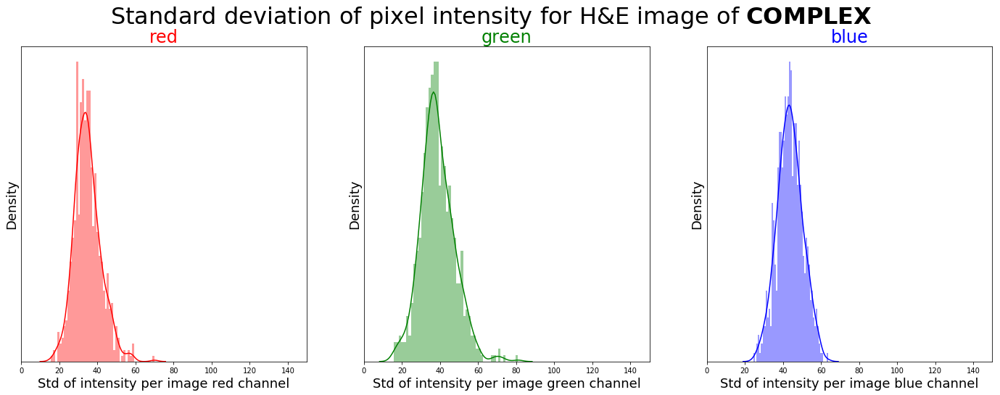

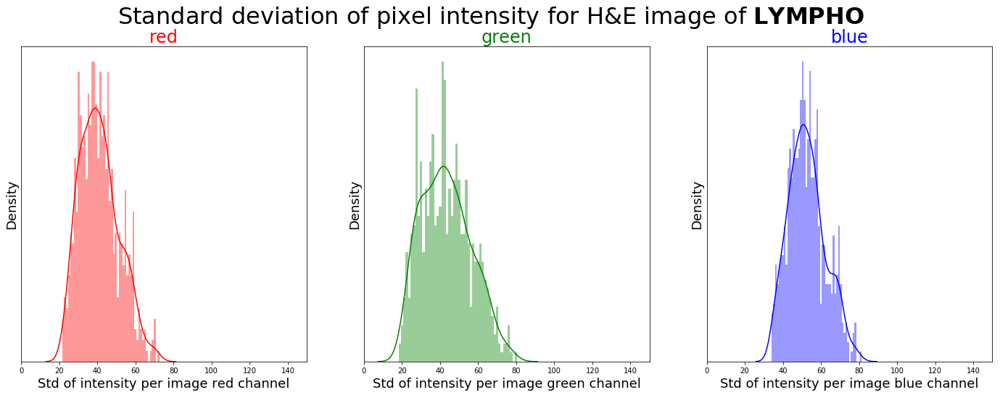

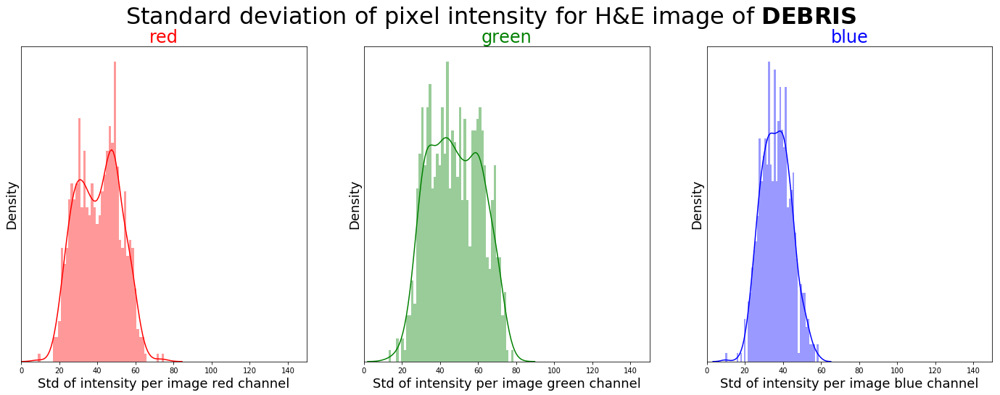

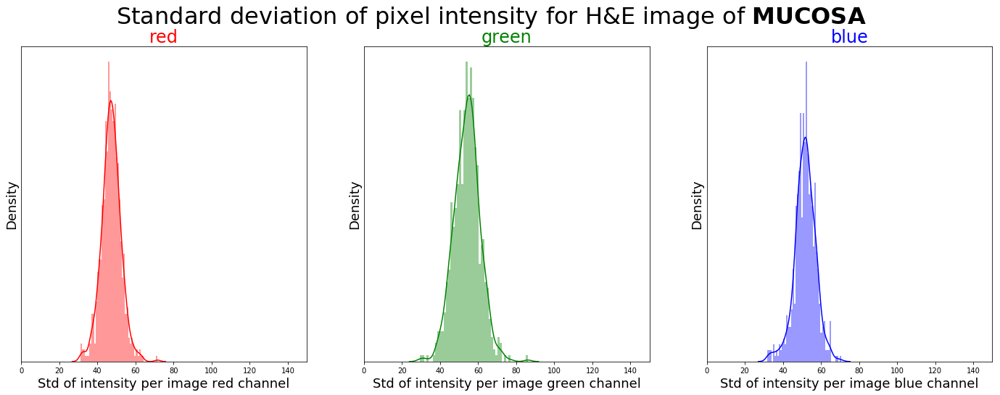

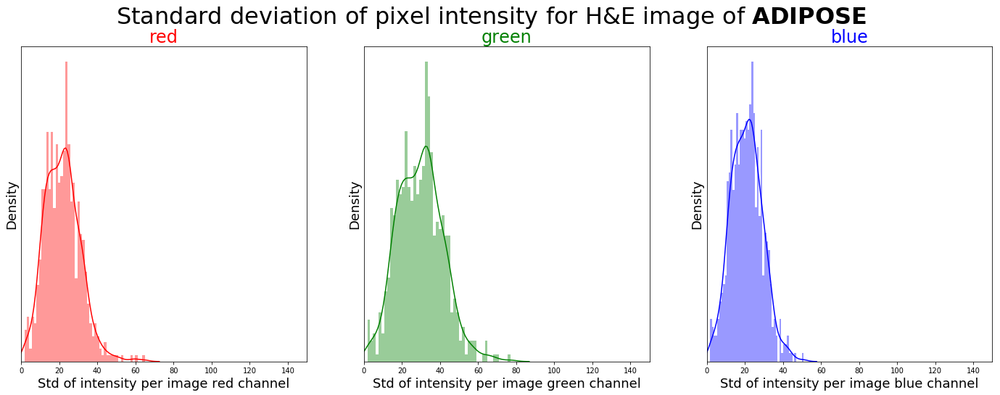

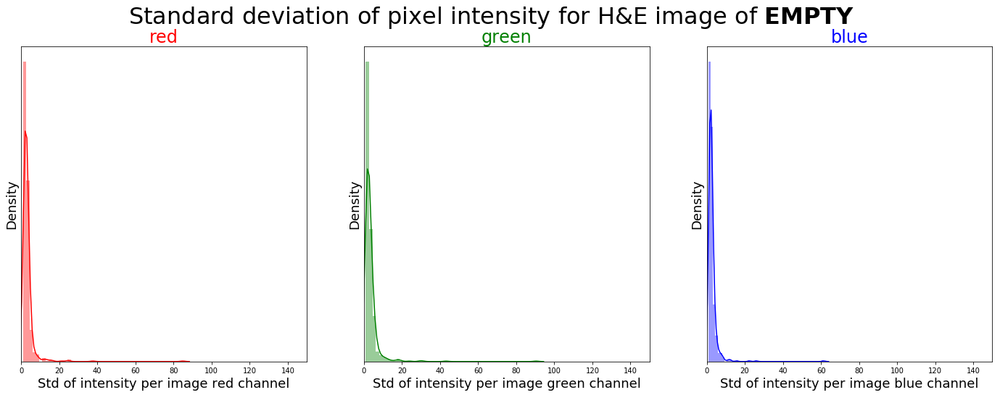

In [26]:
def plotPixel_std(img_label):
    col = ['red', 'green', 'blue']
    col_std = ['red_std', 'green_std', 'blue_std']
    fig, ax = plt.subplots(1,3,figsize=(24,8))
    for i in np.arange(3):
        sns.distplot(pixel_df[pixel_df.label == img_label][col_std[i]], bins = 50, color=col[i], ax = ax[i])
        ax[i].set_title(col[i], color=col[i], fontsize=24)
        ax[i].set_xlabel('Std of intensity per image {} channel'.format(col[i]), fontsize=18)
        ax[i].set_ylabel('Density', fontsize=18)
        ax[i].set_xlim(0,150)
        ax[i].set_yticks([])
    fig.suptitle("Standard deviation of pixel intensity for H&E image of " + r"$\bf{" + str(img_label) + "}$", fontsize = 32)

for i in np.arange(8):
    plotPixel_std(img_labels[i].split('_')[1])

Text(0.5, 0.98, 'Standard deviation of pixel intensity for TUMOR, STROMA, COMPLEX, LYMPHO, DEBRIS and MUCOSA')

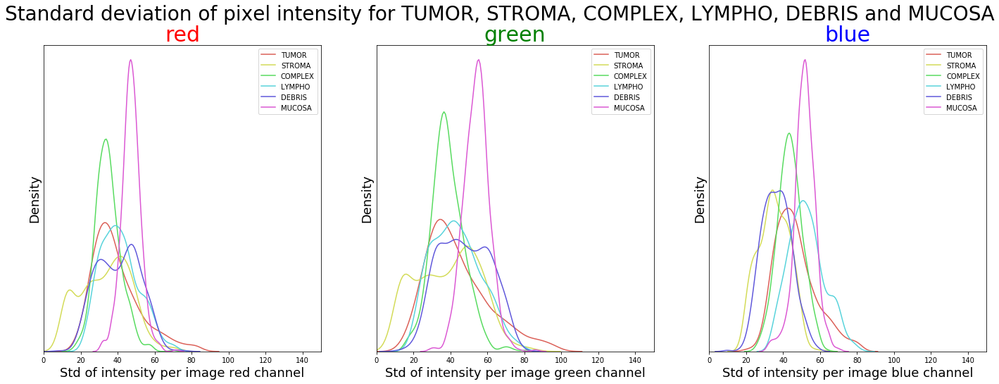

In [28]:
#color = ['#99bbff', '#ff9999', '#ff9900', '#59b300', '#99ff99', '#cc99ff']
palette = sns.color_palette('hls', 6)
col = ['red', 'green', 'blue']
col_std = ['red_std', 'green_std', 'blue_std']
fig, ax = plt.subplots(1,3, figsize=(24,8))
for i in np.arange(3):
    for j in np.arange(6):
        label = img_labels[j].split('_')[1]
        sns.distplot(pixel_df[pixel_df.label == label][col_std[i]], hist = False, bins=50, color = palette[j], label = label, ax = ax[i])
    ax[i].set_title(col[i], color = col[i], fontsize=30)
    ax[i].set_xlabel('Std of intensity per image {} channel'.format(col[i]), fontsize=18)
    ax[i].set_ylabel('Density', fontsize=18)
    ax[i].set_xlim(0,150)
    ax[i].set_yticks([])
    ax[i].legend()
fig.suptitle('Standard deviation of pixel intensity for TUMOR, STROMA, COMPLEX, LYMPHO, DEBRIS and MUCOSA', fontsize=28)

Consistent with the observations dervied from the distribution of average pixel intensity, `EMPTY` and `ADIPOSE` classes have the most homogeneous texture, while `DEBRIS` and `MUCOSA` have relatively higher heterogeneity.

### 1.2.3 Compare individual pixel intensity distribution for each class of images

Above I have computed the average pixel values in each of RGB channels for each image as a measurement of intensity distribution for images from each class. In addition to images, the dataset also provides individual pixel values for each image at different resolution in either RGB mode or GRAY scale. In order to have a better understanding of the pixel pattern for each class, I chose to use pixel values computed at the resolution of 64x64px in grayscale in `hmnist_64_64_L.csv`.

In [37]:
pixels = pd.read_csv('/Volumes/Yuchen_Drive/Colorectal_histology_mnist/hmnist_64_64_L.csv')

In [30]:
pixels.shape

(5000, 4097)

In [31]:
pixels.head()

,pixel0000,pixel0001,pixel0002,pixel0003,pixel0004,pixel0005,pixel0006,pixel0007,pixel0008,pixel0009,...,pixel4087,pixel4088,pixel4089,pixel4090,pixel4091,pixel4092,pixel4093,pixel4094,pixel4095,label
0,134,99,119,130,142,169,152,139,117,87,...,112,89,73,100,120,120,126,140,195,2
1,55,64,74,63,74,75,71,73,70,77,...,79,85,86,77,68,66,65,68,69,2
2,114,116,136,152,132,100,151,150,127,205,...,128,157,159,205,182,143,129,89,122,2
3,86,82,88,85,103,93,98,109,104,115,...,79,80,109,128,89,85,80,63,48,2
4,168,143,140,139,129,123,123,141,137,101,...,231,199,183,195,179,134,142,158,149,2


In [32]:
## To make labeling system more consistent, convert label from [1-8] to [0-7]
pixels['label'] = pixels.label-1
np.unique(pixels.label)

array([0, 1, 2, 3, 4, 5, 6, 7])

Text(0.5, 0.98, '64x64px grayscale images for colorectal histology')

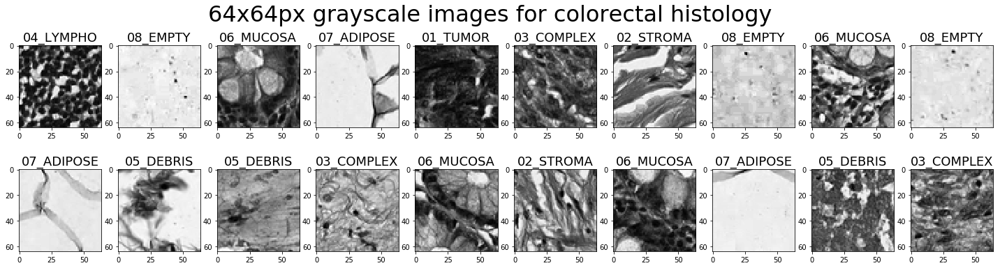

In [34]:
## Visualize grayscale images 
classes = img_labels
fig = plt.figure(figsize=(25,6))
label_to_class_dict = {i:l for i,l in enumerate(classes)}
pixel_array = np.random.choice(len(pixels), 20)
for i, idx in enumerate(pixel_array):
    fig.add_subplot(2,10,i+1)
    img = pixels.iloc[idx,:-1]
    label = pixels.label[idx]
    plt.imshow(np.array(img).reshape(64,64), cmap = 'gray')
    plt.title(label_to_class_dict[label], fontsize=18)
fig.suptitle('64x64px grayscale images for colorectal histology', fontsize = 32)

Text(0.5, 0.98, 'Pixel intensity distribution')

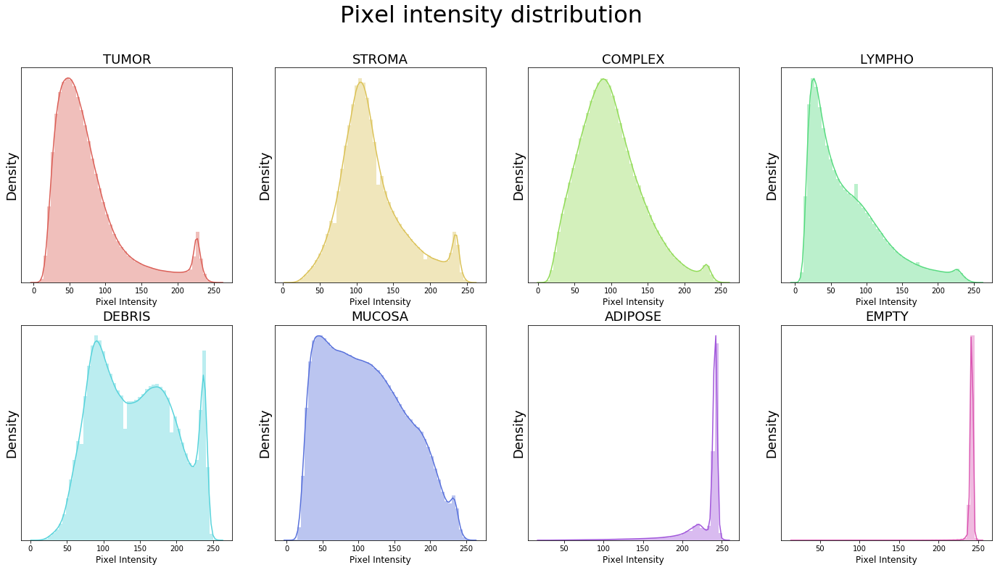

In [35]:
classes = img_labels
id_to_label_dict = {i:l for i,l in enumerate(classes)}
palette=sns.color_palette("hls", len(classes))
fig, axes = plt.subplots(2,4,figsize=(24,12))
for i in np.arange(len(classes)):
    sns.distplot(pixels[pixels.label == i].drop("label", axis=1).values.flatten(), bins = 50, color=palette[i], ax = axes[i//4, i%4])
    axes[i//4, i%4].set_title(id_to_label_dict[i].split('_')[1], fontsize=18)
    axes[i//4, i%4].set_xlabel('Pixel Intensity', fontsize=12)
    axes[i//4, i%4].set_ylabel('Density', fontsize=18)
    axes[i//4, i%4].set_yticks([])
fig.suptitle('Pixel intensity distribution', fontsize=32)

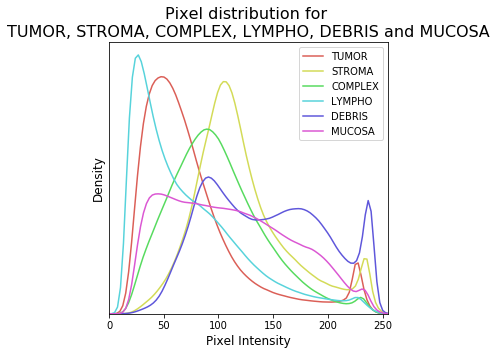

In [36]:
palette = sns.color_palette('hls', 6)
fig, ax = plt.subplots(1,1, figsize=(5,5))
for i in np.arange(6):
    label = img_labels[i].split('_')[1]
    sns.distplot(pixels[pixels.label == i].drop("label", axis=1).values.flatten(), hist = False, bins = 50, label = label, color=palette[i])
ax.set_title('Pixel distribution for \nTUMOR, STROMA, COMPLEX, LYMPHO, DEBRIS and MUCOSA', fontsize=16)
ax.set_xlabel('Pixel Intensity', fontsize=12)
ax.set_ylabel('Density', fontsize=12)
ax.set_xlim(0,255)
ax.set_yticks([])
ax.legend()

The intensity distribution at individual pixel level pretains some of the patterns observed from average intensity analysis, but does provide some additional information.
* Both the `EMPTY` class and `ADIPOSE` class have a sharp high intensity peak, consistent with the previous findings. 
* In addition to the `DEBRIS` class, the `MUCOSA` class also exhibits a very broad intensity distribution, which might be due to high cellular heterogeneity of mucosa. The intestinal mucosa layer is a membrane that lines lumen of colon and is composed of epithelium (epithelial cells),  lamina propria (connective tissue and hosts immune cells) and muscularis mucosae (layer of muscle). Mucosa has different types of cells and secrets mucus which can also be stained and adds more heterogeneity.
* `LYMPHO` contains lymphocytes that have large nucleus with little cytoplasm. Since nucleus will be heavily stained with a 'dark'/'blue' looking appearance and tumor infiltrating lymphocytes often have a high local density, `LYMPHO` class has a much lower pixel intensity compared to the other classes.
* `TUMOR` class has a lower pixel intensity compared to `STROMA` class. This may be due to the large and irregular nucleus that cancer cells have. The hyperproliferation feature of cancer cells may also lead to an increase in local cell density which in turn decreases the staining intensity (less 'empty' space and more nucleus). The `COMPLEX` has an intensity peak in between `TUMOR` and `STROMA` classes, which is consistent with the class features.

### 1.2.4 Visualize image clustering using t-SNE plot

**t-SNE** (t-distributed Stochastic Neighbor Embedding) is a non-linear dimensionality reduction approach for visualization of high-dimensional data in a two- or three-dimensional space. Objects with high similarity are modeled by nearby points and objects with low similarity are modeled by distant points in t-SNE plot. 

In [41]:
def pixel_tsne_plot(feature_df, classes, title='t-SNE plot'):
    label_to_id_dict = {v:i for i,v in enumerate(classes)}
    id_to_label_dict = {v: k for k, v in label_to_id_dict.items()}
    feature_df['class_label'] = feature_df.label.map(id_to_label_dict)
    data = feature_df.iloc[:,:-2]
    data = np.reshape(data, (data.shape[0], -1)).astype(np.float64)
    data_2d = bh_sne(data)
    df_subset = pd.DataFrame({'tsne-2d-one':data_2d[:,0], 'tsne-2d-two':data_2d[:,1], 'target':feature_df.class_label})
    plt.figure(figsize=(8,8))
    tsne = sns.scatterplot(
        x="tsne-2d-one", y="tsne-2d-two",
        hue="target",
        hue_order=classes,
        palette=sns.color_palette("hls", len(classes)),
        data=df_subset,
        legend="full",
        alpha=1)
    plt.title(title, fontsize=20)
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    plt.show(tsne)

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  after removing the cwd from sys.path.


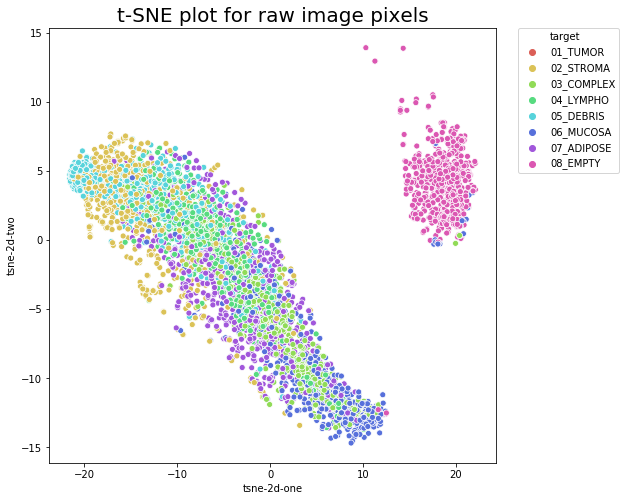

In [42]:
#classes = list(map(lambda x:x.split('_')[1], img_labels))
classes = img_labels
pixel_tsne_plot(shuffle(pixels), classes, title = 't-SNE plot for raw image pixels')

As we can see from the t-SNE plot, `EMPTY` and `ADIPOSE` classes form distinct clusters while the majority of the other 6 classes cluster together. This t-SNE plot is generated using the raw pixel value for each image and based on the pixel intensity distribution plotted above, it is not suprising that `EMPTY` and `ADIPOSE` classes can be distinguished easily from the other 6 classes. However, we do need to build more complex and powerful models such as convolutional neural network (CNN) in order to classify the other 6 classes of tissue types.

# 2. Build CNN from stratch and train images

## 2.1 Image pre-processing and data loading

Before training the model, first we need to split the dataset into training, validation and test datasets. I chose to use the split ratio of 0.7/0.15/0.15 for train/val/test and randomly assign each image to one of the three datasets.

Here I used `SubsetRandomSampler` from `torch.utils.data.sampler` to stratify images.

In [39]:
train_val_test_df = pixel_df.copy()

In [40]:
total_num = train_val_test_df.shape[0]
split1 = int(total_num*0.7)
split2 = int(total_num*0.85)
indices = np.arange(total_num)

np.random.seed(123)
np.random.shuffle(indices)
train_idx, val_idx, test_idx = indices[:split1], indices[split1:split2], indices[split2:]

In [41]:
train_sampler = SubsetRandomSampler(train_idx)
val_sampler = SubsetRandomSampler(val_idx)
test_sampler = SubsetRandomSampler(test_idx)

Image transformation:

1.Resize: Images do have a uniform size of 150x150px but the size is not a power of two or can be divided by a power of two. In order to facilitate the CNN training process (MaxPooling), images will be resized to 144x144px.


2.To prevent overfitting, the following image augmentations will be applied:
   * random rotation
   * random horizontal/vertical flip

   Augmentation will be applied to both training and validation datasets to perform random modifications to both datasets -- test time augmentation (TTA). During the validation process, the predictions will be based on the augmented images.


3.Normalization: pixel values are normalized to the range [-1, 1]. After normalization, all features will have the same range and contribute equally to the model. In addition, the model will be less sensitive to small changes in weights and easier to be optimized.

In [42]:
train_transforms = transforms.Compose([
    transforms.RandomRotation(10),
    transforms.RandomResizedCrop(144),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.5),
    transforms.ToTensor(),
    transforms.Normalize([0.5,0.5,0.5], [0.5,0.5,0.5])
])

In [43]:
BATCH_SIZE = 32
train_path = base_dir
train_data = datasets.ImageFolder(train_path, transform = train_transforms)

train_loader = torch.utils.data.DataLoader(train_data, batch_size=BATCH_SIZE, sampler = train_sampler)
val_loader = torch.utils.data.DataLoader(train_data, batch_size=BATCH_SIZE, sampler = val_sampler)
test_loader = torch.utils.data.DataLoader(train_data, batch_size = BATCH_SIZE, sampler = test_sampler)

print('Number of images in training set: {}'.format(len(train_loader.sampler)))
print('Number of images in validation set: {}'.format(len(val_loader.sampler)))
print('Number of images in testing set: {}'.format(len(test_loader.sampler)))

Number of images in training set: 3500
Number of images in validation set: 750
Number of images in testing set: 750


Visualize images post augmentation

Text(0.5, 0.98, 'H&E images for colorectal histology post augmentation')

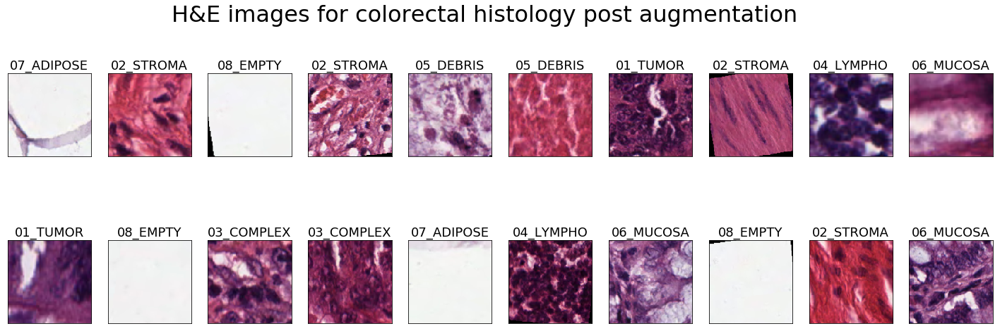

In [16]:
def imshow_transform(img):
    '''visualize images post augmentation'''
    img = img*0.5+0.5
    plt.imshow(np.transpose(img, (1,2,0)))

images, labels = next(iter(train_loader))
images = images.numpy().squeeze()
classes = train_data.classes
palette = sns.color_palette('tab10', 8)

fig = plt.figure(figsize = (25,8))
for idx in np.arange(20):
    ax = fig.add_subplot(2,10,idx+1,xticks=[], yticks=[])
    imshow_transform(images[idx])
    ax.set_title(classes[labels.numpy()[idx]], fontsize=18)
fig.suptitle('H&E images for colorectal histology post augmentation', fontsize = 32)

## 2.2 Build CNN model from scratch

Here is the illustration of the CNN network:

**((ConV-ReLU)x3-MaxPool)x3 --flattening-- FC1-ReLU-FC2**

<img src="images/Image1_CNN.tif" width=600px>

`nn.Dropout` is applied following the MaxPooling layer after each stack of convolutional layers as well as the first fully-connected layer to avoid overfitting. `p` is set as `0.3`, which suggests that in each forward pass, each node will be trandomly dropped with a probability of 0.3. 

In [44]:
class Model(nn.Module):
    def __init__(self):
        super(Model,self).__init__()
        self.conv1_1 = nn.Conv2d(3,32,3,padding=1)
        self.conv1_2 = nn.Conv2d(32,32,3,padding=1)
        self.conv1_3 = nn.Conv2d(32,32,3,padding=1)

        self.conv2_1 = nn.Conv2d(32,64,3,padding=1)
        self.conv2_2 = nn.Conv2d(64,64,3,padding=1)
        self.conv2_3 = nn.Conv2d(64,64,3,padding=1)

        self.conv3_1 = nn.Conv2d(64,128,3,padding=1)
        self.conv3_2 = nn.Conv2d(128,128,3,padding=1)
        self.conv3_3 = nn.Conv2d(128,128,3,padding=1)

        self.pool = nn.MaxPool2d(2,2)
        self.fc1 = nn.Linear(128*18*18,256)
        self.fc2 = nn.Linear(256,8)
        self.dropout = nn.Dropout(0.3)

    def forward(self, x):
        x = F.relu(self.conv1_1(x))
        x = F.relu(self.conv1_2(x))
        x = F.relu(self.conv1_3(x))
        x = self.pool(x)
        x = self.dropout(x)

        x = F.relu(self.conv2_1(x))
        x = F.relu(self.conv2_2(x))
        x = F.relu(self.conv2_3(x))
        x = self.pool(x)
        x = self.dropout(x)

        x = F.relu(self.conv3_1(x))
        x = F.relu(self.conv3_2(x))
        x = F.relu(self.conv3_3(x))
        x = self.pool(x)
        x = self.dropout(x)

        x = x.view(-1,128*18*18)
        x = self.dropout(F.relu(self.fc1(x)))
        x = self.fc2(x)

        return x

## 2.3 Train CNN model

'GPU' can significantly speed up the training process compared to 'CPU'. For this project, I trained the CNN model using GPU in cluster.

In [45]:
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print('device: {}'.format(device.type))

device: cpu


In [46]:
model = Model()
# specify loss function
criterion = nn.CrossEntropyLoss()
# specify optimizer
optimizer = optim.Adam(model.parameters(), lr=0.0001)

In order to prevent overfitting, the following `train` function has both training and validation phases. The function trains images in the training dataset for the specified epochs (one epoch: one cycle through the full training dataset) and after each epoch, runs a full validation step. After each epoch, output of the loss function as well as the prediction accuracy is computed for both training and validation datasets, saved as `train_loss`, `train_acc`, `val_loss` and `val_acc`.

Although the training process will go through the specified number of epochs `n_epochs`, the model with the lowest `val_loss` will be saved. The reason to go through the specified epochs is to understand how the `train_loss`, `train_acc`, `val_loss` and `val_acc` values change following each epoch to help fine-tune hyperparameters to improve the training performance. In routine training jobs, the `Early Stopping` approach can be taken instead so that model training will stop when the specified evaluation metric (eg. accuracy) on the validation set decreases or doesn't improve within a certain number of epochs.

In [47]:
def train(n_epochs, train_loader, val_loader, model, criterion, optimizer, device, save_path):
    '''the train function will perform both forward and backpropagation on training and validation datasets.
    Output: trained model with the lowest val_loss and dataframe containing train_loss/train_acc and val_loss/val_acc for each epoch'''
    epoch_dict={}
    valid_loss_min = np.Inf
    model = model.to(device)
    for epoch in np.arange(n_epochs):
        # Initiate loss and accuracy values
        train_loss = 0.0
        train_acc = 0.0
        val_loss = 0.0
        val_acc = 0.0
        epoch_dict[epoch] = {}
        # Training
        model.train()
        for images, labels in train_loader:
            optimizer.zero_grad()
            images, labels = images.to(device), labels.to(device)
            output = model(images)
            loss = criterion(output, labels)
            loss.backward()
            optimizer.step()
            ## Update loss and acc values for the training process
            train_loss += loss.item()*images.shape[0]
            _, top_class = output.topk(1,dim=1)
            equals = top_class == labels.view(*top_class.shape)
            train_acc += torch.mean(equals.type(torch.FloatTensor)).item()

        # Validation
        else:
            # turn off gradients
            with torch.no_grad():
                # set model to evaluation mode
                model.eval()
                for images, labels in val_loader:
                    images, labels = images.to(device), labels.to(device)
                    output = model(images)
                    loss = criterion(output, labels)
                    ## Update loss and acc values for the validation process
                    val_loss += loss.item()*images.shape[0]
                    _, top_class = output.topk(1,dim=1)
                    equals = top_class == labels.view(*top_class.shape)
                    val_acc += torch.mean(equals.type(torch.FloatTensor)).item()

                ### write training/validation loss/accuracy
                epoch_dict[epoch]['Train_Loss'] = train_loss/len(train_loader.sampler)
                epoch_dict[epoch]['Train_Accuracy'] = train_acc/len(train_loader)
                epoch_dict[epoch]['Val_Loss'] = val_loss/len(val_loader.sampler)
                epoch_dict[epoch]['Val_Accuracy'] = val_acc/len(val_loader)

                print("Epoch: {}/{}.. ".format(epoch+1, n_epochs),
                      "Train Loss: {:.3f}.. ".format(train_loss/len(train_loader.sampler)),
                      "Train Accuracy: {:.3f}.. ".format(train_acc/len(train_loader)),
                      "Validation Loss: {:.3f}.. ".format(val_loss/len(val_loader.sampler)),
                      "Validation Accuracy: {:.3f}".format(val_acc/len(val_loader)))
                
                ## save the model with the lowest val_loss and update valid_loss_min
                if val_loss <= valid_loss_min:
                    print('Validation loss decreased -- Saving model -- \n')
                    torch.save(model.state_dict(), save_path)
                    valid_loss_min = val_loss

    epoch_df = pd.DataFrame.from_dict(epoch_dict, orient = 'index')
    epoch_df['Epoch'] = np.arange(n_epochs)+1
    return model, epoch_df

In [ ]:
n_epochs = 50
save_path = 'models/Colorectal_histology_PyTorch_model1_epoch50_lr4_fc256.pth'
model, epoch_df = train(n_epochs, train_loader, val_loader, model, criterion, optimizer, device, save_path)

## 2.4 Visualize the loss and accuracy curves

In [48]:
epoch_df = pd.read_csv('models/Colorectal_histology_PyTorch_model1_epoch50_lr4_fc256.csv')

Text(0.5, 1.0, 'Training and Validation Accuracy')

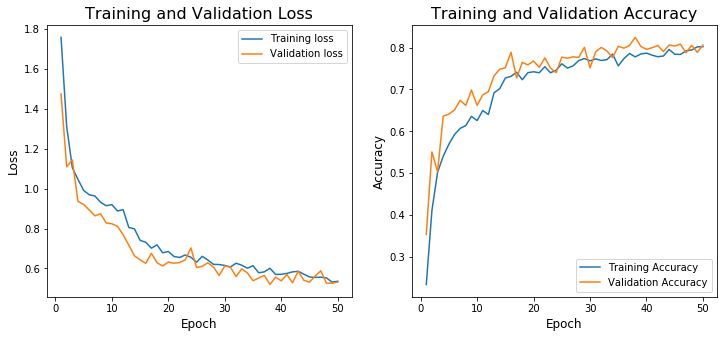

In [49]:
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.plot(epoch_df.Epoch, epoch_df.Train_Loss, label = 'Training loss')
plt.plot(epoch_df.Epoch, epoch_df.Val_Loss, label = 'Validation loss')
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Loss', fontsize=12)
plt.legend()
plt.title('Training and Validation Loss', fontsize=16)

plt.subplot(1,2,2)
plt.plot(epoch_df.Epoch, epoch_df.Train_Accuracy, label = 'Training Accuracy')
plt.plot(epoch_df.Epoch, epoch_df.Val_Accuracy, label = 'Validation Accuracy')
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Accuracy', fontsize=12)
plt.legend()
plt.title('Training and Validation Accuracy', fontsize=16)

## 2.5 Load the trained model

In [50]:
model = Model()
if device.type == 'cpu':
    state_dict = torch.load('models/Colorectal_histology_PyTorch_model1_epoch50_lr4_fc256.pth', map_location='cpu')
else:
    state_dict = torch.load('models/Colorectal_histology_PyTorch_model1_epoch50_lr4_fc256.pth')
model.load_state_dict(state_dict)
for param in model.parameters():
    param.requires_grad=False

## 2.6 Load images from test dataset

In addition to calculating the overall prediction accuracy of the test dataset, it's also important to know which images are classified correctly or incorrectly for future improvement and better interpretation of the classification results. 

Here, I use a modified `torchvision.datasets.ImageFolder` to load images with their path info.

reference: https://gist.github.com/andrewjong/6b02ff237533b3b2c554701fb53d5c4d

In [51]:
class ImageFolderWithPaths(datasets.ImageFolder):
    """Custom dataset that includes image file paths. Extends
    torchvision.datasets.ImageFolder
    """

    # override the __getitem__ method. this is the method dataloader calls
    def __getitem__(self, index):
        # this is what ImageFolder normally returns 
        original_tuple = super(ImageFolderWithPaths, self).__getitem__(index)
        # the image file path
        path = self.imgs[index][0]
        # make a new tuple that includes original and the path
        tuple_with_path = (original_tuple + (path,))
        return tuple_with_path

In [52]:
## No augmentation
test_transforms = transforms.Compose([
    transforms.Resize((144,144)),
    transforms.ToTensor(),
    transforms.Normalize([0.5,0.5,0.5], [0.5,0.5,0.5])
])
test_data = ImageFolderWithPaths(train_path, transform = test_transforms)
test_loader = torch.utils.data.DataLoader(test_data, batch_size = BATCH_SIZE, sampler = test_sampler)
print('Number of images in testing set: {}'.format(len(test_loader.sampler)))

Number of images in testing set: 750


## 2.7 Make prediction on test dataset

In [53]:
def model_eval(test_loader, model, criterion, device, classes):
    '''Apply the trained model to testing dataset and summarize the overall test_loss/test_acc
    also output testing accuracy for each category and the prediction result for each sample as well as the probability'''
    # Initiate loss and accuracy values
    test_loss = 0.0
    test_acc = 0.0
    class_correct = list(0. for i in range(len(classes)))
    class_total = list(0. for i in range(len(classes)))
  
    dt = np.dtype(int)
    true_label = np.array([], dtype = dt)
    pred_label = np.array([], dtype = dt)
    path_array = np.array([])
    prob_array = np.array([])
    probs_array = np.array(classes).reshape(1,-1)
    
    model = model.to(device)
    with torch.no_grad():
        model.eval()
        for images, labels, paths in test_loader:
            path_array = np.append(path_array, np.array(paths))
            images, labels = images.to(device), labels.to(device)
            output = model(images)
            loss = criterion(output, labels)
            test_loss += loss.item()*images.shape[0]
        
            softmax = nn.Softmax(dim=1)
            output_softmax = softmax(output)
            top_probs, preds = output_softmax.topk(1,dim=1)
            equals = preds == labels.view(*preds.shape)
            correct = np.squeeze(equals)
            test_acc += torch.mean(equals.type(torch.FloatTensor)).item()
            for i in range(len(images)):
                label = labels[i].item()
                class_correct[label] += correct[i].item()
                class_total[label] += 1
    
            if device.type == 'cpu':
                true_label = np.append(true_label, labels)
                pred_label = np.append(pred_label, preds)
                prob_array = np.append(prob_array, top_probs)
                probs_array = np.concatenate((probs_array, output_softmax))
      
            else:
                true_label = np.append(true_label, labels.cpu())
                pred_label = np.append(pred_label, preds.cpu())
                prob_array = np.append(prob_array, top_probs.cpu())
                probs_array = np.concatenate((probs_array, output_softmax.cpu()))
            
      
    test_loss = test_loss/len(test_loader.sampler)
    test_acc = test_acc/len(test_loader)
    print('Test Loss: {:.6f}\n'.format(test_loss))
    print('Test Accuracy (Overall): {:.3f}%  ({}/{})\n'.format(np.sum(class_correct)/np.sum(class_total)*100, np.sum(class_correct), np.sum(class_total)))
  
    for i in range(len(classes)):
        if class_total[i] > 0:
            print('Test Accuracy of {}: {:.3f}% ({}/{})'.format(classes[i], class_correct[i]/class_total[i]*100,class_correct[i], class_total[i]))
        else:
            print('Test Accuracy of {}: N/A'.format(classes[i]))
    summary_df = pd.DataFrame({'category': classes, 'correct': class_correct, 'total': class_total})
    pred_df = pd.DataFrame({'file_path': path_array, 'true_label': true_label, 'prediction': pred_label, 'prob': prob_array})
    probs_df = pd.DataFrame(probs_array[1:], columns = probs_array[0])
    probs_df['file_path'] = path_array
    pred_df = pred_df.merge(probs_df, left_on = 'file_path', right_on = 'file_path')
    return summary_df, pred_df

In [54]:
criterion = nn.CrossEntropyLoss()
classes = test_data.classes
summary_df, pred_df = model_eval(test_loader, model, criterion, device, classes)

Test Loss: 0.463646

Test Accuracy (Overall): 83.600%  (627.0/750.0)

Test Accuracy of 01_TUMOR: 93.182% (82.0/88.0)
Test Accuracy of 02_STROMA: 64.634% (53.0/82.0)
Test Accuracy of 03_COMPLEX: 81.053% (77.0/95.0)
Test Accuracy of 04_LYMPHO: 79.787% (75.0/94.0)
Test Accuracy of 05_DEBRIS: 67.000% (67.0/100.0)
Test Accuracy of 06_MUCOSA: 86.458% (83.0/96.0)
Test Accuracy of 07_ADIPOSE: 97.938% (95.0/97.0)
Test Accuracy of 08_EMPTY: 96.939% (95.0/98.0)


In [55]:
# summary_df.to_csv('models/Colorectal_histology_PyTorch_model1_epoch50_lr4_fc256_summary_df.csv', index = False)
# pred_df.to_csv('models/Colorectal_histology_PyTorch_model1_epoch50_lr4_fc256_pred_df.csv', index = False)

Text(7.4, 83, 'Avg:\n83.6%')

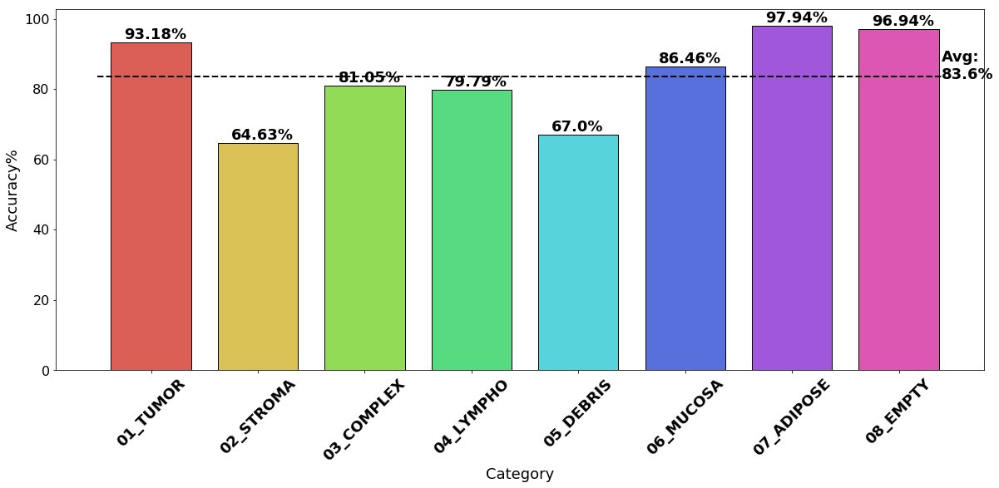

In [56]:
summary_df['accuracy'] = np.round(summary_df.correct/summary_df.total*100,2)
fig = plt.figure(figsize = (20,8))
ax = fig.add_subplot(1,1,1)
width = 0.75 # the width of the bars 
ind = np.arange(len(classes))  # the x locations for the groups
ax.bar(ind, summary_df.accuracy, width, edgecolor='black', color = sns.color_palette('hls', 8))
plt.xticks(ind, labels = classes, fontsize=18, fontweight='bold', rotation=45)
plt.yticks(fontsize=16)
plt.xlabel('Category', fontsize=18)
plt.ylabel('Accuracy%', fontsize=18)
for i, v in enumerate(summary_df.accuracy):
    ax.text(i-0.25, v + 1, str(np.round(v,2))+'%', fontweight='bold', fontsize=18)
ax.plot([-0.5, 7.4], [83.600, 83.600], "k--", linewidth=2)
ax.text(7.4, 83, 'Avg:\n'+str(83.600)+'%', fontweight='bold', fontsize=18)

## 2.8 Evaluate model performance

### 2.8.1 Confusion matrix

In [57]:
cm = confusion_matrix(pred_df.true_label, pred_df.prediction)

In [58]:
def plot_confusion_matrix(cm, classes,title='Confusion matrix',cmap=plt.cm.Blues):    
    plt.figure(figsize=(10,10))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title, fontsize=26)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45, fontsize=12, fontweight='bold')
    plt.yticks(tick_marks, classes, fontsize=12, fontweight='bold')

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, '{:d} \n({:.2f}%)'.format(cm[i, j], cm[i,j]/cm.sum()*100), horizontalalignment="center", color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('True label', fontsize=20)
    plt.xlabel('Predicted label', fontsize=20)
    plt.tight_layout()

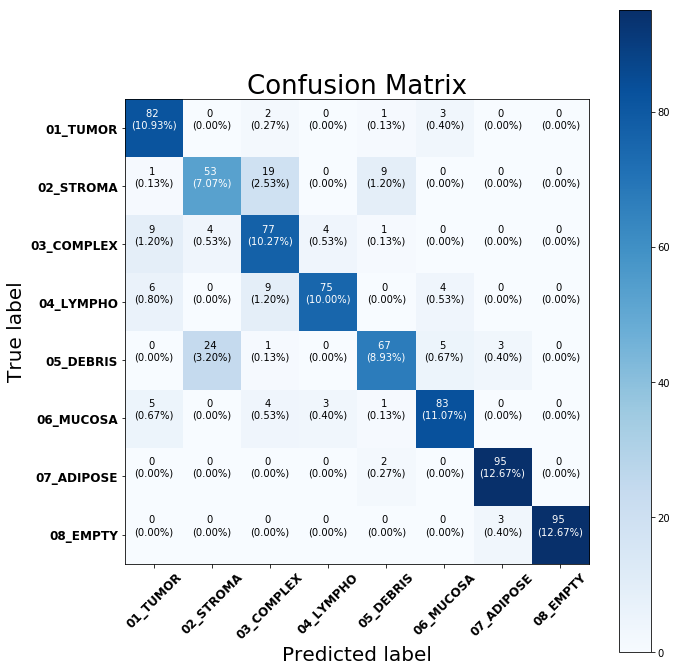

In [59]:
plot_confusion_matrix(cm, classes, title = 'Confusion Matrix')

# 3. Transfer Learning

The classification performance of the CNN network build-from-scratch is suboptimal. One possible reason is the small dataset we have for this study as only 5000 images are included. One approach to overcome the limitation of small dataset is to employ `Transfer Learning` to use a ConvNet pretrained on a very large dataset (e.g. ImageNet). The final fully-connected layer (classifier) of the pretrained model will be replaced with the new classifier with output that fits our dataset, and the rest of the ConvNet will be treated as a fixed feature extractor. During training, only the final linear classifier is trained on top of the fixed feature extractor for the new dataset. 

Here, I use [Inception-v3](https://arxiv.org/pdf/1512.00567.pdf), a 42 layer deep network that uses inception modules as building blocks.

<img src="images/Image2_InceptionV3_Architecture.png" width=600px>

(Figure adapted from [ref2](https://medium.com/@sh.tsang/review-inception-v3-1st-runner-up-image-classification-in-ilsvrc-2015-17915421f77c))

There are several points that we need to pay attention when using `Inception-v3` model:
   * **Auxiliary Classifier**: Inception-v3 has auxiliary classifier and the overall loss is caculated based on both auxiliary output and the final output. Thus, in addition to replacing the final classifier, the auxiliary classifier also needs to be replaced. The `train` function will be updated in the step of loss calculation as `train_aux` function.
   
   * **Input size**: Different from the other pretrained models that expect an input size of (224, 224), `Inception_v3` requires the input size to be (299,299). 

reference: 
1. https://www.cv-foundation.org/openaccess/content_cvpr_2016/papers/Szegedy_Rethinking_the_Inception_CVPR_2016_paper.pdf
2. https://medium.com/@sh.tsang/review-inception-v3-1st-runner-up-image-classification-in-ilsvrc-2015-17915421f77c
3. http://cs231n.github.io/transfer-learning/
4. https://pytorch.org/tutorials/beginner/finetuning_torchvision_models_tutorial.html
5. https://discuss.pytorch.org/t/how-to-optimize-inception-model-with-auxiliary-classifiers/7958

## 3.1 Load Inception_v3 pretrained model and replace classifiers

In [60]:
inception = models.inception_v3(pretrained=True)
print(inception.AuxLogits.fc)
print(inception.fc)
for param in inception.parameters():
    param.requires_grad = False

Linear(in_features=768, out_features=1000, bias=True)
Linear(in_features=2048, out_features=1000, bias=True)


In [61]:
## auxiliary classifier
inception.AuxLogits.fc = nn.Sequential(nn.Linear(inception.AuxLogits.fc.in_features, 8))
## final classifier
inception.fc = nn.Sequential(nn.Linear(inception.fc.in_features, 8))

## 3.2 Load images and apply image transformation

In [62]:
train_transforms = transforms.Compose([
    transforms.RandomRotation(10),
    transforms.Resize((299,299)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.5),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

In [63]:
train_data = datasets.ImageFolder(train_path, transform = train_transforms)

train_loader = torch.utils.data.DataLoader(train_data, batch_size=BATCH_SIZE, sampler = train_sampler)
val_loader = torch.utils.data.DataLoader(train_data, batch_size=BATCH_SIZE, sampler = val_sampler)

## 3.3 Train Inception_v3 model (classifiers)

As introduced above, modificaitons are added to the previous `train` function to add computation for the auxiliary output and loss in the training phase as `train_aux`.

In [64]:
def train_aux(n_epochs, train_loader, val_loader, model, criterion, optimizer, device, save_path):
    '''train function specific for Inception_V3 to calcualte auxiliary output'''
    epoch_dict={}
    valid_loss_min = np.Inf
    model = model.to(device)
    for epoch in np.arange(n_epochs):
        # Initiate loss and accuracy values
        train_loss = 0.0
        train_acc = 0.0
        val_loss = 0.0
        val_acc = 0.0
        epoch_dict[epoch] = {}
        # Training
        model.train()
        for images, labels in train_loader:
            optimizer.zero_grad()
            images, labels = images.to(device), labels.to(device)
            # both final output and auxiliary output
            output, aux_output = model(images)
            loss1 = criterion(output, labels)
            loss2 = criterion(aux_output, labels)
            loss = loss1+0.4*loss2
            loss.backward()
            optimizer.step()
            ## Update loss and acc values for the training process
            train_loss += loss.item()*images.shape[0]
            _, top_class = output.topk(1,dim=1)
            equals = top_class == labels.view(*top_class.shape)
            train_acc += torch.mean(equals.type(torch.FloatTensor)).item()

        # Validation
        else:
            with torch.no_grad():
                model.eval()
                for images, labels in val_loader:
                    images, labels = images.to(device), labels.to(device)
                    output = model(images)
                    loss = criterion(output, labels)
                    ## Update loss and acc values for the validation process
                    val_loss += loss.item()*images.shape[0]
                    _, top_class = output.topk(1,dim=1)
                    equals = top_class == labels.view(*top_class.shape)
                    val_acc += torch.mean(equals.type(torch.FloatTensor)).item()

                ### write training/validation loss/accuracy
                epoch_dict[epoch]['Train_Loss'] = train_loss/len(train_loader.sampler)
                epoch_dict[epoch]['Train_Accuracy'] = train_acc/len(train_loader)
                epoch_dict[epoch]['Val_Loss'] = val_loss/len(val_loader.sampler)
                epoch_dict[epoch]['Val_Accuracy'] = val_acc/len(val_loader)

                print("Epoch: {}/{}.. ".format(epoch+1, n_epochs),
                      "Train Loss: {:.3f}.. ".format(train_loss/len(train_loader.sampler)),
                      "Train Accuracy: {:.3f}.. ".format(train_acc/len(train_loader)),
                      "Validation Loss: {:.3f}.. ".format(val_loss/len(val_loader.sampler)),
                      "Validation Accuracy: {:.3f}".format(val_acc/len(val_loader)))
                if val_loss <= valid_loss_min:
                    print('\n Validation loss decreased -- Saving model -- \n')
                    torch.save(model.state_dict(), save_path)
                    valid_loss_min = val_loss

    epoch_df = pd.DataFrame.from_dict(epoch_dict, orient = 'index')
    epoch_df['Epoch'] = np.arange(n_epochs)+1
    return model, epoch_df

In [65]:
## Parameters from both the final classifier and the auxiliary classifier need to be trained
params = [inception.fc.parameters(), inception.AuxLogits.fc.parameters()]
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(itertools.chain(*params), lr=0.0001)

In [ ]:
n_epochs = 50
save_path = 'models/Colorectal_histology_inception_epoch50_lr4_fc1.pth'
inception, epoch_df = train_aux(n_epochs, train_loader, val_loader, inception, criterion, optimizer, device, save_path)

## 3.4 Evaluate model performance

In [66]:
epoch_df = pd.read_csv('models/Colorectal_histology_inception_epoch50_lr4_fc1.csv')

Text(0.5, 1.0, 'Training and Validation Accuracy')

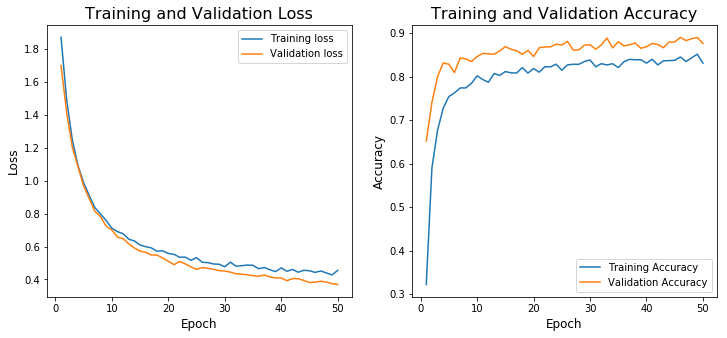

In [67]:
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.plot(epoch_df.Epoch, epoch_df.Train_Loss/1.4, label = 'Training loss')
plt.plot(epoch_df.Epoch, epoch_df.Val_Loss, label = 'Validation loss')
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Loss', fontsize=12)
plt.legend()
plt.title('Training and Validation Loss', fontsize=16)

plt.subplot(1,2,2)
plt.plot(epoch_df.Epoch, epoch_df.Train_Accuracy, label = 'Training Accuracy')
plt.plot(epoch_df.Epoch, epoch_df.Val_Accuracy, label = 'Validation Accuracy')
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Accuracy', fontsize=12)
plt.legend()
plt.title('Training and Validation Accuracy', fontsize=16)

In [68]:
inception = models.inception_v3(pretrained=True)
inception.AuxLogits.fc = nn.Sequential(nn.Linear(inception.AuxLogits.fc.in_features, 8))
inception.fc = nn.Sequential(nn.Linear(inception.fc.in_features, 8))
if device.type == 'cpu':
    state_dict = torch.load('models/Colorectal_histology_inception_epoch50_lr4_fc1.pth', map_location='cpu')
else:
    state_dict = torch.load('models/Colorectal_histology_inception_epoch50_lr4_fc1.pth')
inception.load_state_dict(state_dict)
for param in inception.parameters():
    param.requires_grad=False

In [69]:
## No augmentation
test_transforms = transforms.Compose([
    transforms.Resize((299,299)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])
test_data = ImageFolderWithPaths(train_path, transform = test_transforms)
test_loader = torch.utils.data.DataLoader(test_data, batch_size = BATCH_SIZE, sampler = test_sampler)
print('Number of images in testing set: {}'.format(len(test_loader.sampler)))

Number of images in testing set: 750


In [70]:
criterion = nn.CrossEntropyLoss()
summary_df_inception, pred_df_inception = model_eval(test_loader, inception, criterion, device, classes)

Test Loss: 0.440711

Test Accuracy (Overall): 85.733%  (643.0/750.0)

Test Accuracy of 01_TUMOR: 89.773% (79.0/88.0)
Test Accuracy of 02_STROMA: 70.732% (58.0/82.0)
Test Accuracy of 03_COMPLEX: 76.842% (73.0/95.0)
Test Accuracy of 04_LYMPHO: 74.468% (70.0/94.0)
Test Accuracy of 05_DEBRIS: 89.000% (89.0/100.0)
Test Accuracy of 06_MUCOSA: 89.583% (86.0/96.0)
Test Accuracy of 07_ADIPOSE: 95.876% (93.0/97.0)
Test Accuracy of 08_EMPTY: 96.939% (95.0/98.0)


In [71]:
# summary_df_inception.to_csv('models/Colorectal_histology_inception_epoch50_lr4_fc1_summary_df.csv', index = False)
# pred_df_inception.to_csv('models/Colorectal_histology_inception_epoch50_lr4_fc1_pred_df.csv', index = False)

Text(7.4, 85, 'Avg:\n85.733%')

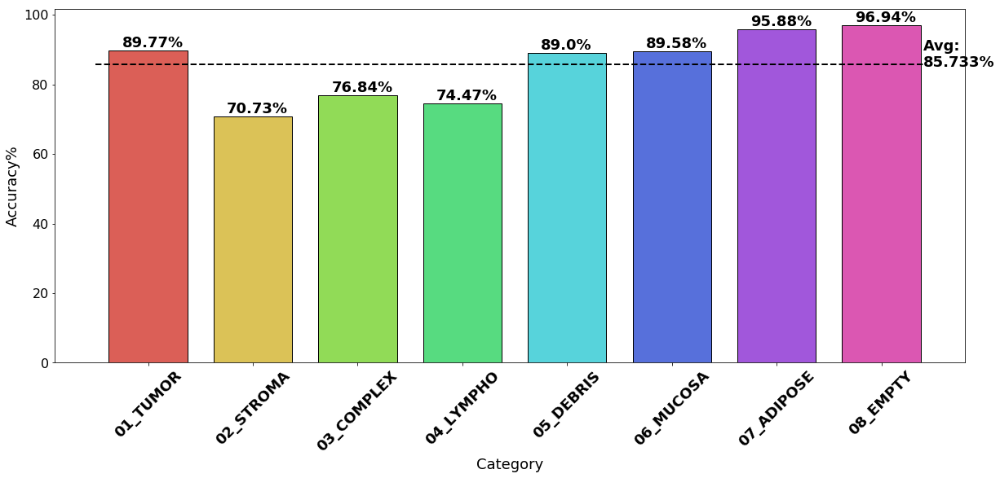

In [72]:
summary_df_inception['accuracy'] = np.round(summary_df_inception.correct/summary_df_inception.total*100,2)
fig = plt.figure(figsize = (20,8))
ax = fig.add_subplot(1,1,1)
width = 0.75 # the width of the bars 
ind = np.arange(len(classes))  # the x locations for the groups
ax.bar(ind, summary_df_inception.accuracy, width, edgecolor='black', color = sns.color_palette('hls', 8))
plt.xticks(ind, labels = classes, fontsize=18, fontweight='bold', rotation=45)
plt.yticks(fontsize=16)
plt.xlabel('Category', fontsize=18)
plt.ylabel('Accuracy%', fontsize=18)
for i, v in enumerate(summary_df_inception.accuracy):
    ax.text(i-0.25, v + 1, str(np.round(v,2))+'%', fontweight='bold', fontsize=18)
ax.plot([-0.5, 7.4], [85.733, 85.733], "k--", linewidth=2)
ax.text(7.4, 85, 'Avg:\n'+str(85.733)+'%', fontweight='bold', fontsize=18)

### Confusion matrix

In [73]:
cm_inception = confusion_matrix(pred_df_inception.true_label, pred_df_inception.prediction)

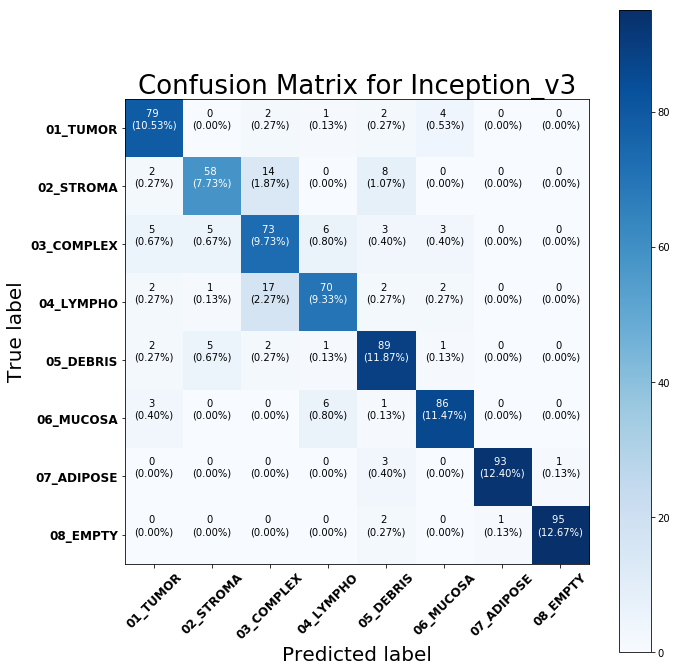

In [74]:
plot_confusion_matrix(cm_inception, classes, title = 'Confusion Matrix for Inception_v3')

## 3.5 Add another fully-connected layer before the classifer of Inception_v3

In [76]:
inception_fc2 = models.inception_v3(pretrained=True)
for param in inception_fc2.parameters():
    param.requires_grad = False
inception_fc2.fc = nn.Sequential(nn.Linear(inception_fc2.fc.in_features, 256),
                             nn.ReLU(),
                             nn.Dropout(0.3),
                             nn.Linear(256, 8))
inception_fc2.AuxLogits.fc = nn.Sequential(nn.Linear(inception_fc2.AuxLogits.fc.in_features, 256),
                                       nn.ReLU(),
                                       nn.Dropout(0.3),
                                       nn.Linear(256, 8))

In [77]:
## Parameters from both the final classifier and the auxiliary classifier need to be trained
params = [inception_fc2.fc.parameters(), inception_fc2.AuxLogits.fc.parameters()]
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(itertools.chain(*params), lr=0.0001)

In [ ]:
n_epochs = 50
save_path = 'models/Colorectal_histology_inception_epoch50_lr4_fc2.pth'
inception_fc2, epoch_df = train_aux(n_epochs, train_loader, val_loader, inception_fc2, criterion, optimizer, device, save_path)

In [78]:
epoch_df = pd.read_csv('models/Colorectal_histology_inception_epoch50_lr4_fc2.csv')

Text(0.5, 1.0, 'Training and Validation Accuracy')

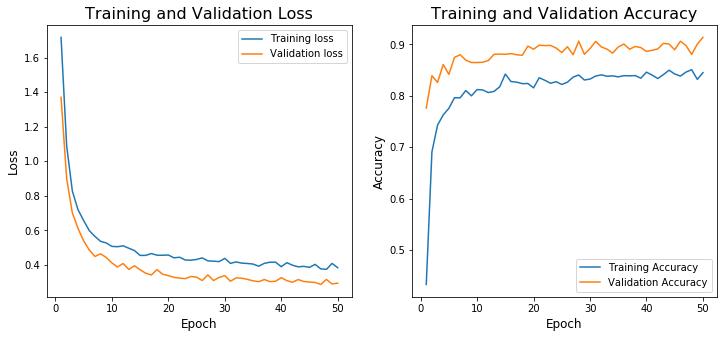

In [79]:
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.plot(epoch_df.Epoch, epoch_df.Train_Loss/1.4, label = 'Training loss')
plt.plot(epoch_df.Epoch, epoch_df.Val_Loss, label = 'Validation loss')
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Loss', fontsize=12)
plt.legend()
plt.title('Training and Validation Loss', fontsize=16)

plt.subplot(1,2,2)
plt.plot(epoch_df.Epoch, epoch_df.Train_Accuracy, label = 'Training Accuracy')
plt.plot(epoch_df.Epoch, epoch_df.Val_Accuracy, label = 'Validation Accuracy')
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Accuracy', fontsize=12)
plt.legend()
plt.title('Training and Validation Accuracy', fontsize=16)

In [80]:
inception_fc2 = models.inception_v3(pretrained=True)
inception_fc2.fc = nn.Sequential(nn.Linear(inception_fc2.fc.in_features, 256),
                             nn.ReLU(),
                             nn.Dropout(0.3),
                             nn.Linear(256, 8))
inception_fc2.AuxLogits.fc = nn.Sequential(nn.Linear(inception_fc2.AuxLogits.fc.in_features, 256),
                                       nn.ReLU(),
                                       nn.Dropout(0.3),
                                       nn.Linear(256, 8))

if device.type == 'cpu':
    state_dict = torch.load('models/Colorectal_histology_inception_epoch50_lr4_fc2.pth', map_location='cpu')
else:
    state_dict = torch.load('models/Colorectal_histology_inception_epoch50_lr4_fc2.pth')
inception_fc2.load_state_dict(state_dict)
for param in inception_fc2.parameters():
    param.requires_grad=False

In [81]:
## No augmentation
test_transforms = transforms.Compose([
    transforms.Resize((299,299)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])
test_data = ImageFolderWithPaths(train_path, transform = test_transforms)
test_loader = torch.utils.data.DataLoader(test_data, batch_size = BATCH_SIZE, sampler = test_sampler)
print('Number of images in testing set: {}'.format(len(test_loader.sampler)))

Number of images in testing set: 750


In [82]:
criterion = nn.CrossEntropyLoss()
summary_df_inception_fc2, pred_df_inception_fc2 = model_eval(test_loader, inception_fc2, criterion, device, classes)

Test Loss: 0.328038

Test Accuracy (Overall): 89.867%  (674.0/750.0)

Test Accuracy of 01_TUMOR: 89.773% (79.0/88.0)
Test Accuracy of 02_STROMA: 82.927% (68.0/82.0)
Test Accuracy of 03_COMPLEX: 83.158% (79.0/95.0)
Test Accuracy of 04_LYMPHO: 84.043% (79.0/94.0)
Test Accuracy of 05_DEBRIS: 89.000% (89.0/100.0)
Test Accuracy of 06_MUCOSA: 93.750% (90.0/96.0)
Test Accuracy of 07_ADIPOSE: 94.845% (92.0/97.0)
Test Accuracy of 08_EMPTY: 100.000% (98.0/98.0)


In [40]:
# summary_df_inception_fc2.to_csv('models/Colorectal_histology_inception_epoch50_lr4_fc2_summary_df.csv', index = False)
# pred_df_inception_fc2.to_csv('models/Colorectal_histology_inception_epoch50_lr4_fc2_pred_df.csv', index = False)
summary_df_inception_fc2 = pd.read_csv('models/Colorectal_histology_inception_epoch50_lr4_fc2_summary_df.csv')
# pred_df_inception_fc2 = pd.read_csv('models/Colorectal_histology_inception_epoch50_lr4_fc2_pred_df.csv')

Text(0.5, 1.0, 'Prediction accuracy for each type of tissues by Inception_fc2 model')

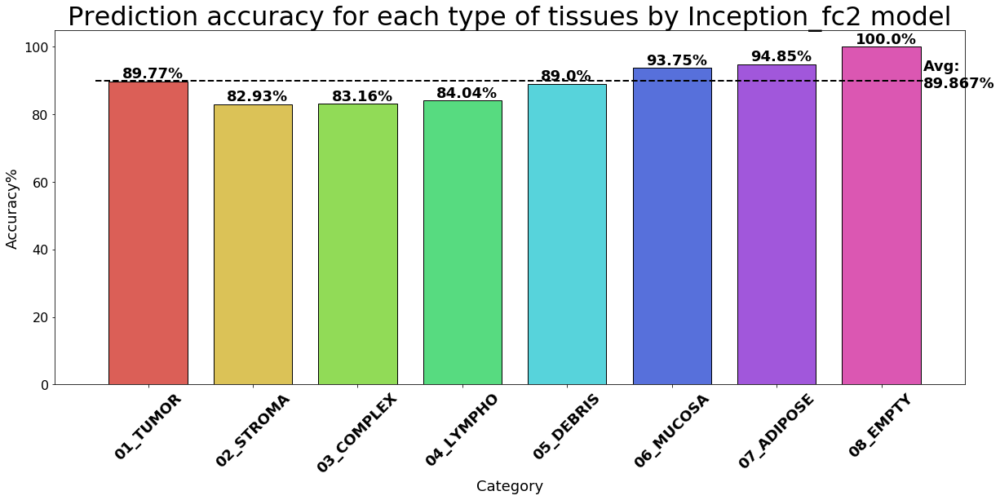

In [44]:
summary_df_inception_fc2['accuracy'] = np.round(summary_df_inception_fc2.correct/summary_df_inception_fc2.total*100,2)
fig = plt.figure(figsize = (20,8))
ax = fig.add_subplot(1,1,1)
width = 0.75 # the width of the bars 
ind = np.arange(len(classes))  # the x locations for the groups
ax.bar(ind, summary_df_inception_fc2.accuracy, width, edgecolor='black', color = sns.color_palette('hls', 8))
plt.xticks(ind, labels = classes, fontsize=18, fontweight='bold', rotation=45)
plt.yticks(fontsize=16)
plt.xlabel('Category', fontsize=18)
plt.ylabel('Accuracy%', fontsize=18)
for i, v in enumerate(summary_df_inception_fc2.accuracy):
    ax.text(i-0.25, v + 1, str(np.round(v,2))+'%', fontweight='bold', fontsize=18)
ax.plot([-0.5, 7.4], [89.867, 89.867], "k--", linewidth=2)
ax.text(7.4, 88, 'Avg:\n'+str(89.867)+'%', fontweight='bold', fontsize=18)
plt.title('Prediction accuracy for each tissue type by Inception_fc2 model', fontsize = 32)

### Confusion matrix

In [85]:
cm_inception_fc2 = confusion_matrix(pred_df_inception_fc2.true_label, pred_df_inception_fc2.prediction)

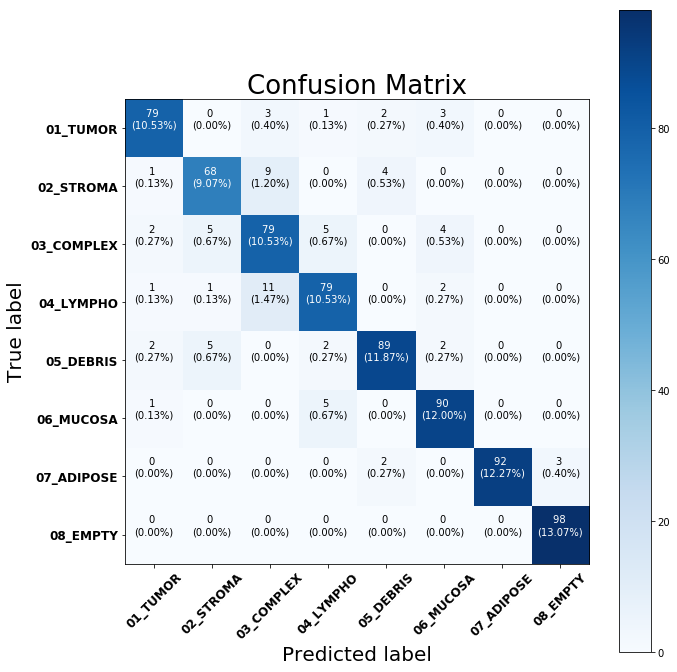

In [86]:
plot_confusion_matrix(cm_inception_fc2, classes, title = 'Confusion Matrix')

### ROC curve

In [101]:
pred_df_inception_fc2.head()

,file_path,true_label,prediction,prob,01_TUMOR,02_STROMA,03_COMPLEX,04_LYMPHO,05_DEBRIS,06_MUCOSA,07_ADIPOSE,08_EMPTY
0,/Volumes/Yuchen_Drive/Colorectal_histology_mni...,2,5,0.367157,0.269129,0.017116,0.163291,0.048567,0.130679,0.367157,0.003558,0.000502
1,/Volumes/Yuchen_Drive/Colorectal_histology_mni...,3,3,0.992477,0.002198,0.000033,0.003400,0.992477,0.000236,0.001631,0.000016,0.000009
2,/Volumes/Yuchen_Drive/Colorectal_histology_mni...,2,2,0.462280,0.004893,0.349866,0.462280,0.007069,0.173777,0.000782,0.000739,0.000593
3,/Volumes/Yuchen_Drive/Colorectal_histology_mni...,7,7,0.978075,0.000091,0.000102,0.000051,0.000053,0.000265,0.000021,0.021341,0.978075
4,/Volumes/Yuchen_Drive/Colorectal_histology_mni...,0,0,0.855638,0.855638,0.001640,0.002313,0.011140,0.087295,0.039382,0.001990,0.000603


In [103]:
from sklearn.metrics import roc_curve, auc
fpr = dict()
tpr = dict()
auc_list = []
label_to_class_dict = {i:l for i,l in enumerate(classes)}
for i in np.arange(len(classes)):
    true_label_array = (pred_df_inception_fc2.true_label == i)*1
    probs = pred_df_inception_fc2[label_to_class_dict[i]]
    fpr[i], tpr[i], _ = roc_curve(true_label_array, probs)
    auc_value = auc(fpr[i], tpr[i])
    auc_list.append(auc_value)

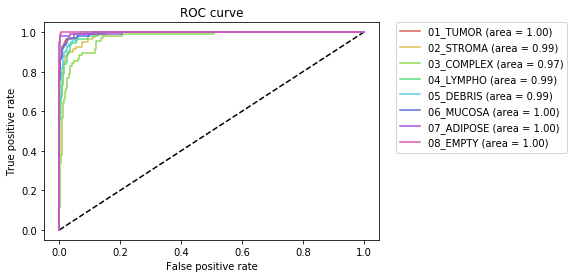

In [104]:
palette = sns.color_palette('hls', 8)
plt.figure(1)
plt.plot([0, 1], [0, 1], 'k--')
for i in np.arange(len(classes)):
    plt.plot(fpr[i], tpr[i], color = palette[i], label='{} (area = {:.2f})'''.format(classes[i], auc_list[i]))
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

### View classification results for a panel of randomly selected images from test dataset

In [43]:
def plot_image(i, paths, labels_array, ps_darray, classes):
    img_path = paths[i]
    plt.imshow(readImage_rgb(img_path))
    plt.xticks([])
    plt.yticks([])
    
    pred = np.argmax(ps_darray[i])
    if pred == labels_array[i]:
        color = 'blue'
    else:
        color = 'red'
    plt.xlabel('pred: {} ({:.2f}%)\ntrue_label: {}'.format(classes[pred], np.max(ps_darray[i])*100, classes[labels_array[i]]), color = color)

def plot_classification(i, labels_array, ps_darray, classes):
    thisplot = plt.barh(np.arange(len(classes)), ps_darray[i], color = '#777777')
    plt.yticks(np.arange(len(classes)), classes)
    plt.xlim(0,1)
    plt.xlabel('probability')
    plt.ylabel('classes')
    pred = np.argmax(ps_darray[i])
    thisplot[pred].set_color('red')
    thisplot[labels_array[i]].set_color('blue')

In [93]:
images, labels, paths = next(iter(test_loader))
with torch.no_grad():
    inception_fc2.eval()
    output = inception_fc2(images)
    softmax = nn.Softmax(dim=1)
    ps = softmax(output)
    labels_array = labels.numpy().squeeze()
    ps_darray = ps.numpy().squeeze()

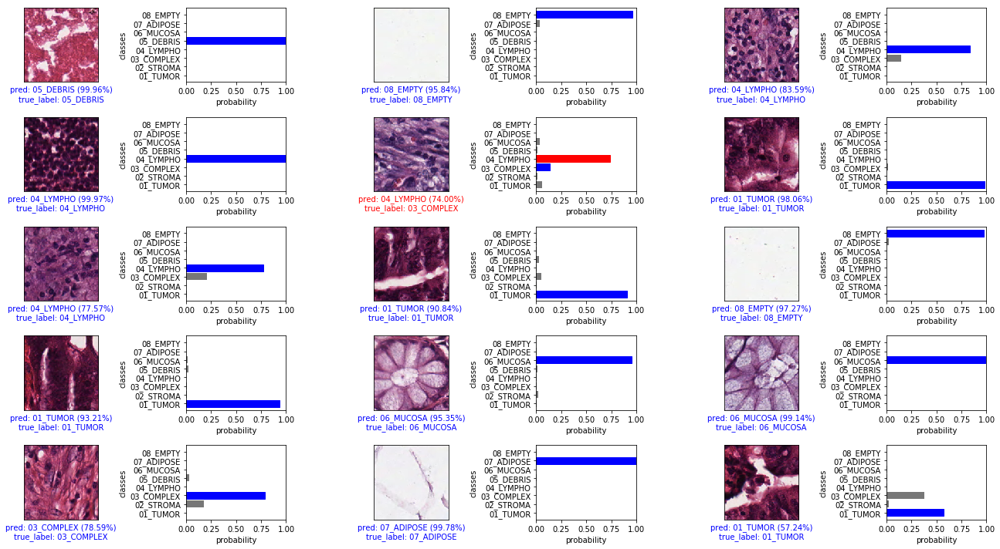

In [94]:
## view a panel of images in the testing set
num_rows = 5
num_cols = 3
plt.figure(figsize=(3*2*num_cols,2*num_rows))
for i in np.arange(15):
    plt.subplot(num_rows, num_cols*2, 2*i+1)
    plot_image(i, paths, labels_array, ps_darray, classes)
    plt.subplot(num_rows, num_cols*2, 2*i+2)
    plot_classification(i, labels_array, ps_darray, classes)
plt.tight_layout()

### View misclassified images from each individual class

In [97]:
def plot_misclassified(class_name, pred_df, classes):
    class_to_label_dict = {i.split('_')[1]:l for l,i in enumerate(classes)}
    label = class_to_label_dict[class_name]
    class_df = pred_df[(pred_df.true_label == label)&(pred_df.prediction != label)]
    num_cols = 3
    num_rows = len(class_df)//3+2
    
    fig = plt.figure(figsize=(3*2*num_cols,2*num_rows))
    for i in np.arange(len(class_df)):
        plt.subplot(num_rows, num_cols*2, 2*i+1+2*num_cols)
        plot_image(i, np.array(class_df.file_path), np.array(class_df.true_label), class_df.iloc[:,4:].to_numpy(), classes)
        plt.subplot(num_rows, num_cols*2, 2*i+2+2*num_cols)
        plot_classification(i, np.array(class_df.true_label), class_df.iloc[:,4:].to_numpy(), classes)
    fig.suptitle("Misclassified images from "+r"$\bf{" + str(classes[label].split('_')[1]) + "}$" + " class", fontsize=32)
    plt.tight_layout()  

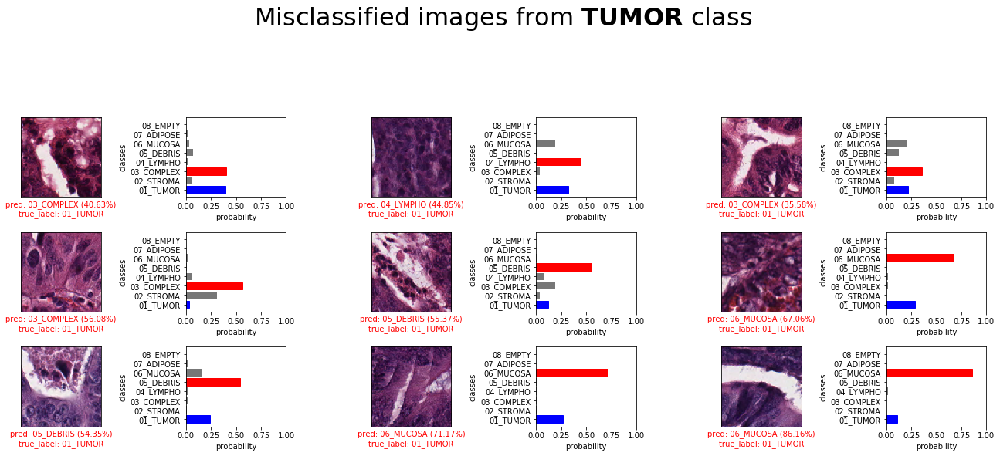

In [98]:
plot_misclassified('TUMOR', pred_df_inception_fc2, classes)

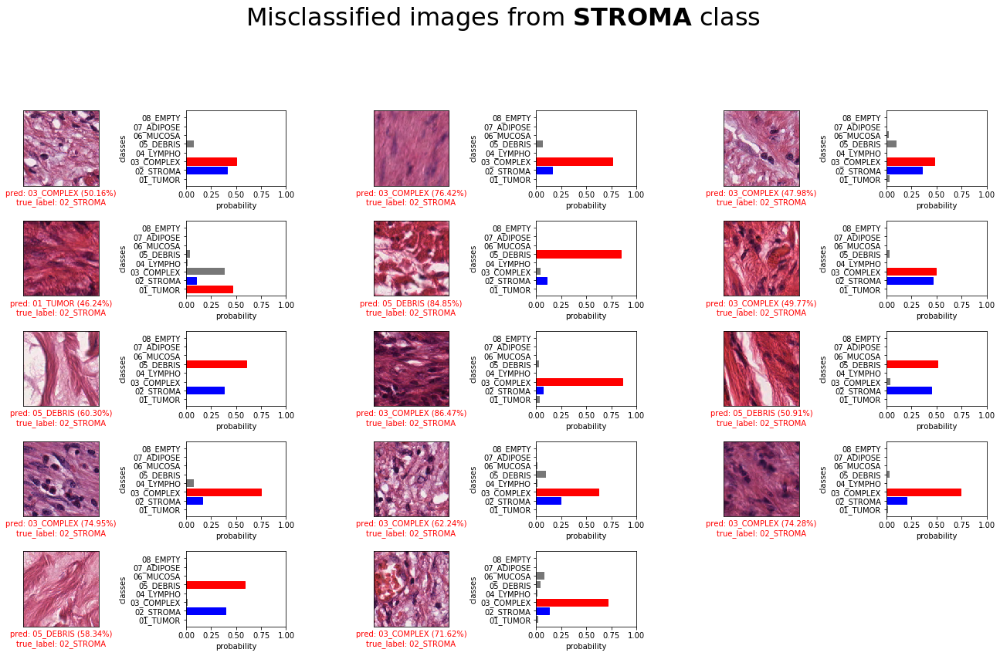

In [99]:
plot_misclassified('STROMA', pred_df_inception_fc2, classes)

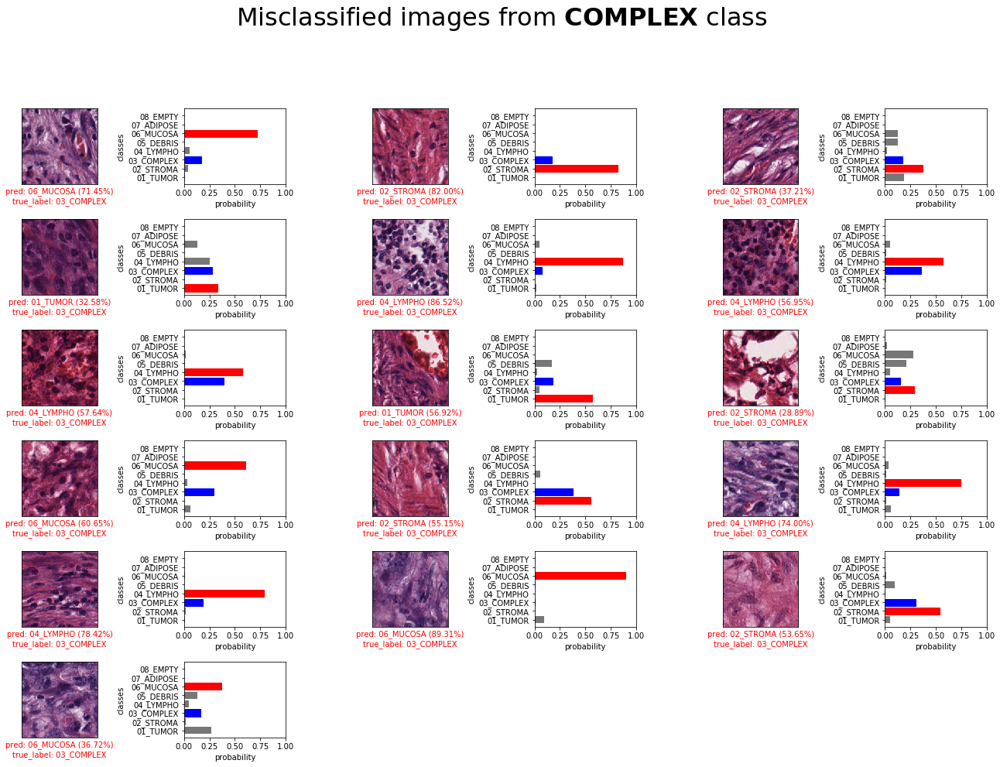

In [100]:
plot_misclassified('COMPLEX', pred_df_inception_fc2, classes)

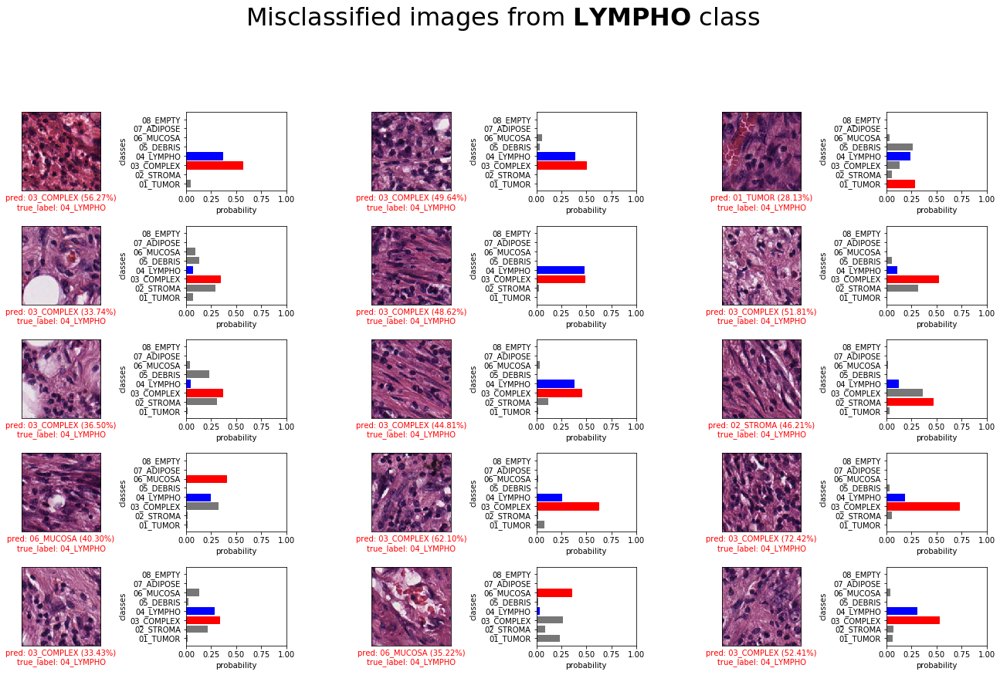

In [101]:
plot_misclassified('LYMPHO', pred_df_inception_fc2, classes)

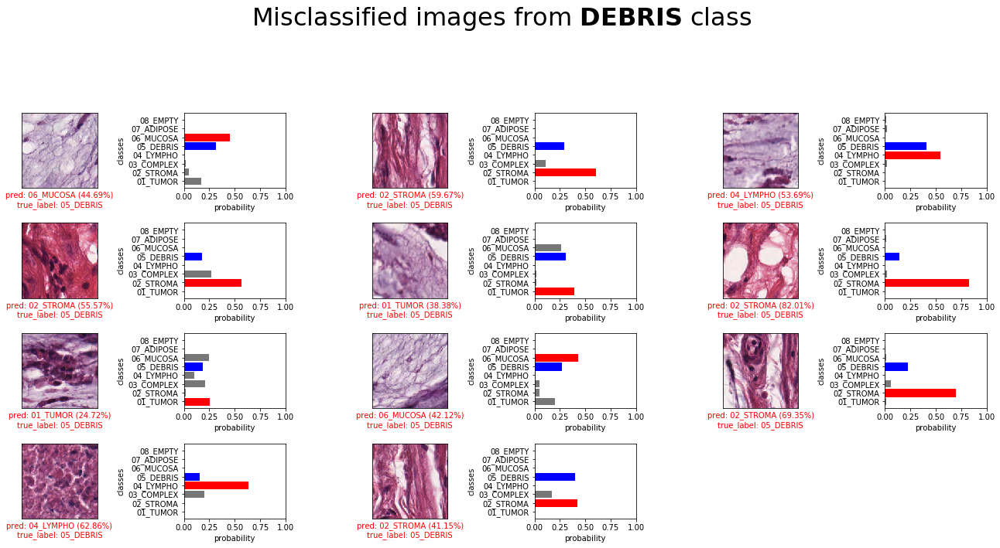

In [102]:
plot_misclassified('DEBRIS', pred_df_inception_fc2, classes)

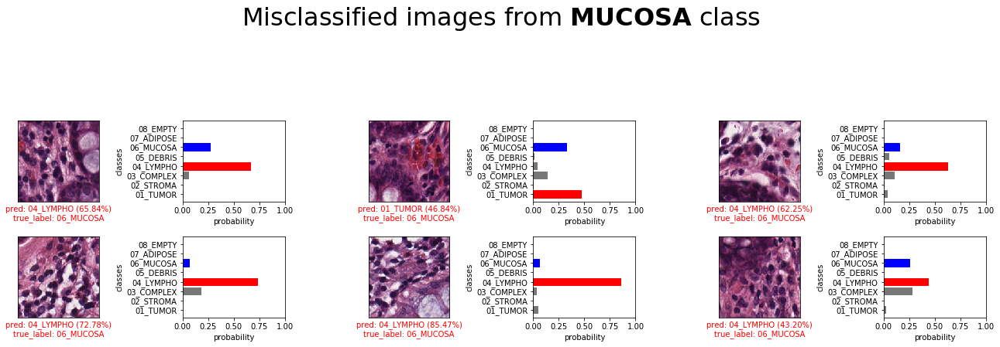

In [103]:
plot_misclassified('MUCOSA', pred_df_inception_fc2, classes)

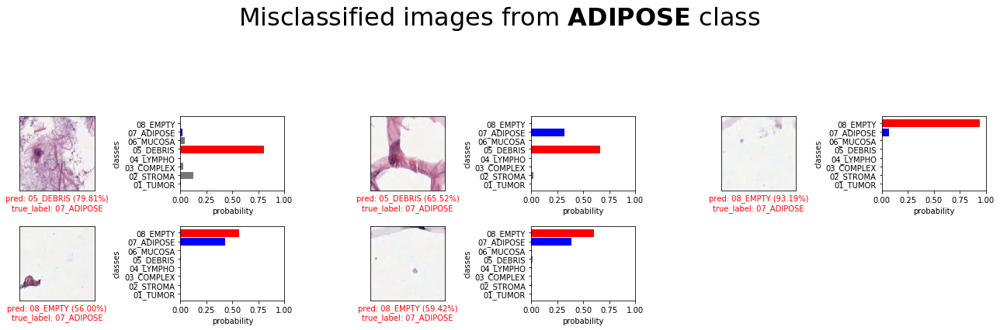

In [104]:
plot_misclassified('ADIPOSE', pred_df_inception_fc2, classes)

# 4. Summary of models

In [28]:
model1_summary_df = pd.read_csv('models/Colorectal_histology_PyTorch_model1_epoch50_lr4_fc256_summary_df.csv', index_col = 'category')
inception_fc1_summary_df = pd.read_csv('models/Colorectal_histology_inception_epoch50_lr4_fc1_summary_df.csv', index_col = 'category')
inception_fc2_summary_df = pd.read_csv('models/Colorectal_histology_inception_epoch50_lr4_fc2_summary_df.csv', index_col = 'category')

In [29]:
model1_summary_df = model1_summary_df.append(pd.Series(model1_summary_df.sum(), name = 'total_acc'))
inception_fc1_summary_df = inception_fc1_summary_df.append(pd.Series(inception_fc1_summary_df.sum(), name = 'total_acc'))
inception_fc2_summary_df = inception_fc2_summary_df.append(pd.Series(inception_fc2_summary_df.sum(), name = 'total_acc'))

In [30]:
model1_acc = model1_summary_df.correct/model1_summary_df.total
inception_fc1_acc = inception_fc1_summary_df.correct/inception_fc1_summary_df.total
inception_fc2_acc = inception_fc2_summary_df.correct/inception_fc2_summary_df.total
acc_summary = pd.DataFrame({'cnn_scratch': model1_acc, 'inception_fc1': inception_fc1_acc, 'inception_fc2':inception_fc2_acc})

In [31]:
acc_summary

,cnn_scratch,inception_fc1,inception_fc2
category,,,
01_TUMOR,0.931818,0.897727,0.897727
02_STROMA,0.646341,0.707317,0.829268
03_COMPLEX,0.810526,0.768421,0.831579
04_LYMPHO,0.797872,0.744681,0.840426
05_DEBRIS,0.670000,0.890000,0.890000
06_MUCOSA,0.864583,0.895833,0.937500
07_ADIPOSE,0.979381,0.958763,0.948454
08_EMPTY,0.969388,0.969388,1.000000
total_acc,0.836000,0.857333,0.898667


Text(8.9, 80, 'Best \nAvg_acc:\n89.867%')

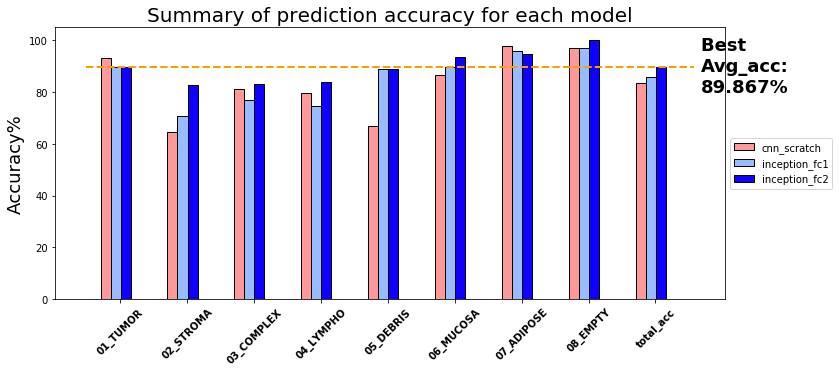

In [39]:
cnn_models = acc_summary.columns.values
colors = ['#ff9999', '#99bbff', '#1000ff']
#palette = sns.color_palette('hls', 8)
fig, ax = plt.subplots(1,1,figsize=(12,5))
category = acc_summary.index.values
barWidth = 0.15
threshold=acc_summary.loc['total_acc', 'inception_fc2']
for i in np.arange(3):
    plt.bar(np.arange(9)+barWidth*i, acc_summary.loc[:, cnn_models[i]]*100, color = colors[i], width=barWidth, edgecolor='black', label=cnn_models[i])
plt.xticks([r + barWidth + 0.07 for r in np.arange(9)], category, fontsize=10, rotation=45, fontweight = 'bold')
plt.ylabel('Accuracy%', fontsize=18)
plt.title('Summary of prediction accuracy for each model', fontsize=20,)
ax.plot([-0.3, 8.8], [threshold*100, threshold*100], "k--", linewidth=2, color = '#f6a000')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
ax.text(8.9, 80, 'Best \nAvg_acc:\n'+str(np.round(threshold*100,3))+'%', fontweight='bold', fontsize=18)

# 5. CNN visualization

## 5.1 t-SNE plots to view features extracted by InceptionV3

In [108]:
def feature_extraction(test_loader, model, device, classes, n_feature):
    dt = np.dtype(int)
    true_label = np.array([], dtype = dt)
    path_array = np.array([])
    feature_array = np.array(['idx'+str(i)for i in np.arange(n_feature)]).reshape(1,n_feature)
  
    model = model.to(device)
    with torch.no_grad():
        model.eval()
        for images, labels, paths in test_loader:
            path_array = np.append(path_array, np.array(paths))
            images, labels = images.to(device), labels.to(device)
            output = model(images)
            
            if device.type == 'cpu':
                true_label = np.append(true_label, labels)
                feature_array = np.concatenate((feature_array, output))
      
            else:
                true_label = np.append(true_label, labels.cpu())
                feature_array = np.concatenate((feature_array, output.cpu()))
                
    feature_df = pd.DataFrame(feature_array[1:], columns = feature_array[0], index = path_array)
    feature_df['label'] = true_label
    return feature_df

In [109]:
def feature_tsne_plot(feature_df, classes, title='t-SNE plot'):
    label_to_id_dict = {v:i for i,v in enumerate(classes)}
    id_to_label_dict = {v: k for k, v in label_to_id_dict.items()}
    feature_df['class_label'] = feature_df.label.map(id_to_label_dict)
    data = feature_df.iloc[:,:-2]
    data = np.reshape(data, (data.shape[0], -1)).astype(np.float64)
    data_2d = bh_sne(data)
    df_subset = pd.DataFrame({'tsne-2d-one':data_2d[:,0], 'tsne-2d-two':data_2d[:,1], 'target':feature_df.class_label})
    plt.figure(figsize=(8,8))
    tsne = sns.scatterplot(
        x="tsne-2d-one", y="tsne-2d-two",
        hue="target",
        hue_order=classes,
        palette=sns.color_palette("hls", len(classes)),
        data=df_subset,
        legend="full",
        alpha=1)
    plt.title(title, fontsize=16)
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    plt.show(tsne)

In [110]:
inception_fc2 = models.inception_v3(pretrained=True)
inception_fc2.fc = nn.Sequential(nn.Linear(inception_fc2.fc.in_features, 256),
                             nn.ReLU(),
                             nn.Dropout(0.3),
                             nn.Linear(256, 8))
inception_fc2.AuxLogits.fc = nn.Sequential(nn.Linear(inception_fc2.AuxLogits.fc.in_features, 256),
                                       nn.ReLU(),
                                       nn.Dropout(0.3),
                                       nn.Linear(256, 8))
if device.type == 'cpu':
    state_dict = torch.load('models/Colorectal_histology_inception_epoch50_lr4_fc2.pth', map_location='cpu')
else:
    state_dict = torch.load('models/Colorectal_histology_inception_epoch50_lr4_fc2.pth')
inception_fc2.load_state_dict(state_dict)
for param in inception_fc2.parameters():
    param.requires_grad=False

In [111]:
new_classifier = nn.Sequential(*list(inception_fc2.fc.children())[:-3])
inception_fc2.fc = new_classifier

In [112]:
img_transforms = transforms.Compose([
    transforms.Resize((299,299)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

train_data = ImageFolderWithPaths(train_path, transform = img_transforms)
train_loader = torch.utils.data.DataLoader(train_data, batch_size = BATCH_SIZE, sampler = train_sampler)

test_data = ImageFolderWithPaths(train_path, transform = img_transforms)
test_loader = torch.utils.data.DataLoader(test_data, batch_size = BATCH_SIZE, sampler = test_sampler)

In [117]:
inception_fc2_feature_train_df = feature_extraction(train_loader, inception_fc2, device, classes, 256)
inception_fc2_feature_test_df = feature_extraction(test_loader, inception_fc2, device, classes, 256)

In [114]:
# inception_fc2_feature_train_df.to_csv('models/Colorectal_histology_inception_epoch50_lr4_fc2_feature_train_df.csv', index = False)
# inception_fc2_feature_test_df.to_csv('models/Colorectal_histology_inception_epoch50_lr4_fc2_feature_test_df.csv', index = False)

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  after removing the cwd from sys.path.


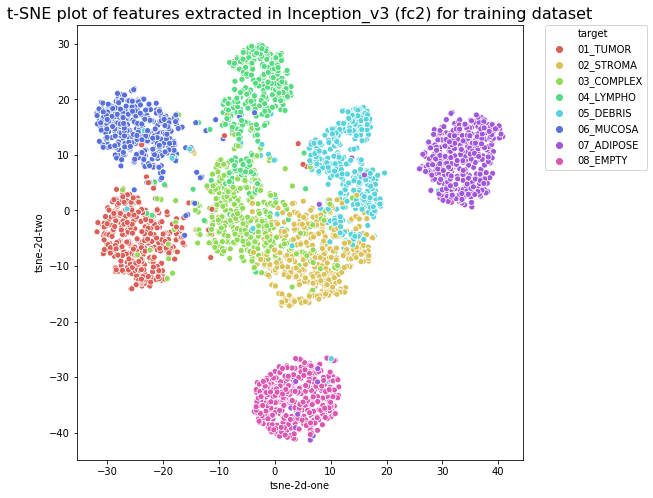

In [119]:
feature_tsne_plot(shuffle(inception_fc2_feature_train_df), classes, title = 't-SNE plot of features extracted in Inception_v3 (fc2) for training dataset')

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  after removing the cwd from sys.path.


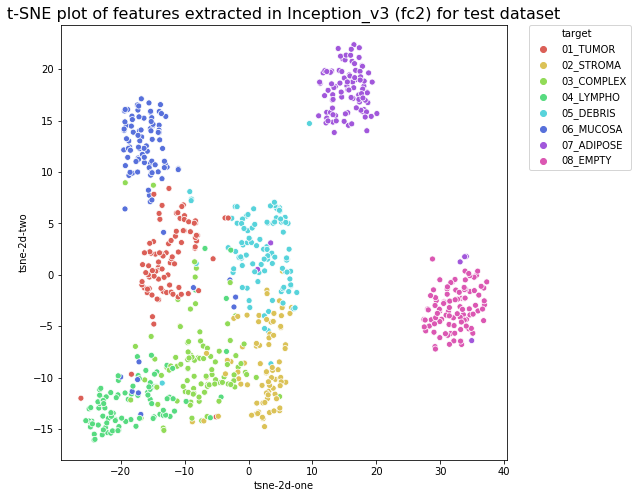

In [115]:
feature_tsne_plot(shuffle(inception_fc2_feature_test_df), classes, title = 't-SNE plot of features extracted in Inception_v3 (fc2) for test dataset')

The clustering result illustrated in the t-SNE plots of the two models (Inception_v3_fc1 and Inception_v3_fc2) is consistent with the overal prediction accuracy for the 8 classes. Generally, adding two fully-connected layers to the classifier of Inception_v3 (fc2) shows better separation among different classes as viewed from t-SNE plot as well as better prediction accuracy. It's also obvious from the t-SNE plot that features extracted by the trained Inception_v3 model for several data points fall in in the incorrect classes in both training and testing datasets, which explain the misclassified data points of prediction.

# 6. Application

In [3]:
def readImage_rgb(img_path):
    '''OpenCV loads color images in BGR mode and converts to RGB mode for visualization;
       output: (H x W x n_channel)'''
    img_bgr = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    return img_rgb

In [4]:
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
classes = ['01_TUMOR', '02_STROMA', '03_COMPLEX', '04_LYMPHO', '05_DEBRIS', '06_MUCOSA', '07_ADIPOSE', '08_EMPTY']
tissue_types = [i.split('_')[1] for i in classes]
print(tissue_types)

['TUMOR', 'STROMA', 'COMPLEX', 'LYMPHO', 'DEBRIS', 'MUCOSA', 'ADIPOSE', 'EMPTY']


In [5]:
inception_fc2 = models.inception_v3(pretrained=True)
inception_fc2.fc = nn.Sequential(nn.Linear(inception_fc2.fc.in_features, 256),
                             nn.ReLU(),
                             nn.Dropout(0.3),
                             nn.Linear(256, 8))
inception_fc2.AuxLogits.fc = nn.Sequential(nn.Linear(inception_fc2.AuxLogits.fc.in_features, 256),
                                       nn.ReLU(),
                                       nn.Dropout(0.3),
                                       nn.Linear(256, 8))
if device.type == 'cpu':
    state_dict = torch.load('models/Colorectal_histology_inception_epoch50_lr4_fc2.pth', map_location='cpu')
else:
    state_dict = torch.load('models/Colorectal_histology_inception_epoch50_lr4_fc2.pth')
inception_fc2.load_state_dict(state_dict)
for param in inception_fc2.parameters():
    param.requires_grad=False

In [26]:
img_paths = glob('/Volumes/Yuchen_Drive/Colorectal_histology_mnist/Kather_texture_2016_larger_images_10/*.tif')

In [8]:
loc_list = [(200, 200), (600, 600), (1200, 600), (600, 1200), (3000, 2000), (3000, 3600), (4800, 3000), (2000, 3800), (1200, 4800)]

In [15]:
def histology_cls_patch(img_path, loc_list):
    fig, ax = plt.subplots(1,1,figsize=(8,8))
    img = readImage_rgb(img_path)
    ax.imshow(img)
    for i in np.arange(len(loc_list)):
        loc = loc_list[i]
        box = patches.Rectangle((loc[0]-75, loc[1]-75),150,150,linewidth=2,edgecolor='gold',facecolor='none', linestyle=':', capstyle='round')
        ax.add_patch(box)
        ax.text(loc[0]+50, loc[1]+15, i+1, fontsize=15, color = 'gold', fontweight='bold')

In [27]:
def histology_cls(img_path, loc_list, model, tissue_types, device):
    num_cols = 3
    num_rows = len(loc_list)//3+1
    fig = plt.figure(figsize=(3*2*num_cols,2*num_rows))
    img = readImage_rgb(img_path)
    
    img_transforms = transforms.Compose([
        transforms.Resize((299,299)),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])])
    
    for i in np.arange(len(loc_list)):
        loc = loc_list[i]
        img_crop = img[loc[1]-75:loc[1]+75,loc[0]-75:loc[0]+75,:] 
        img_pil = Image.fromarray(img_crop.astype('uint8'), 'RGB')
        with torch.no_grad():
            model.eval()
            input_img = torch.unsqueeze(img_transforms(img_pil).to(device), dim=0)
            output = inception_fc2(input_img)
            softmax = nn.Softmax(dim=1)
            output_softmax = softmax(output)
            top_prob, pred = output_softmax.topk(1,dim=1)
            top_prob, pred = top_prob.cpu().item(), pred.cpu().item()
        
        ax1 = fig.add_subplot(num_rows, num_cols*2, 2*i+1)
        ax1.imshow(img_crop)
        ax1.set_xticks([])
        ax1.set_yticks([])
        ax1.set_title('loc{}_pred: {} \n({:.2f}% confidence)'.format(i+1, tissue_types[pred], top_prob*100))
        
        ax2 = fig.add_subplot(num_rows, num_cols*2, 2*i+2)
        palette = sns.color_palette('hls', 8)
        col_list = ['#777777' if i != pred else palette[pred] for i in np.arange(len(tissue_types))]
        ax2.barh(np.arange(len(tissue_types)), output_softmax.numpy().squeeze(), color = col_list)
        ax2.set_yticks(np.arange(len(tissue_types)))
        ax2.set_yticklabels(tissue_types)
        ax2.set_xlim(0,1)
        ax2.set_xlabel('probability')
        ax2.set_ylabel('tissue_types')
    plt.tight_layout()

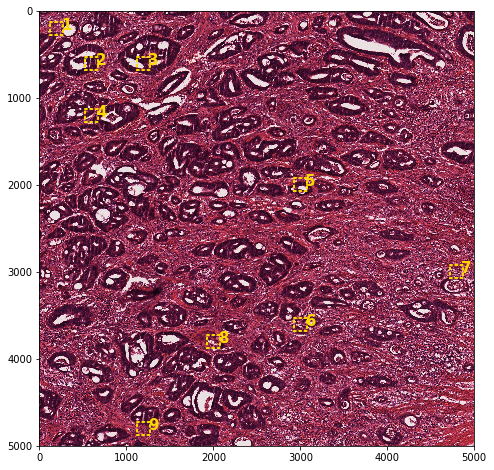

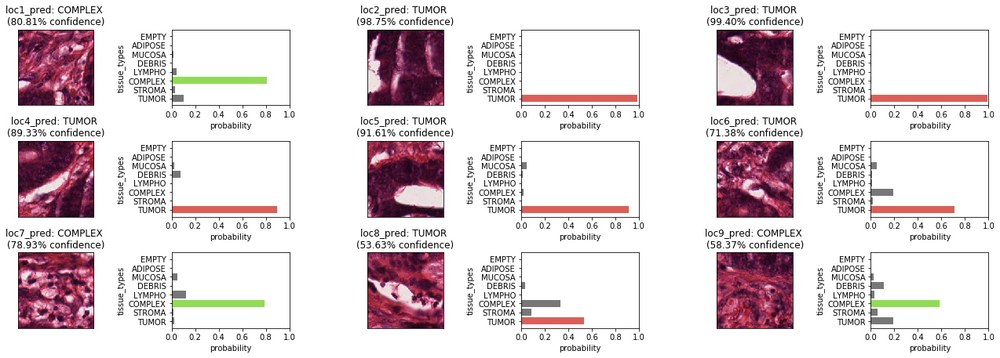

In [29]:
histology_cls_patch(img_paths[0], loc_list)
histology_cls(img_paths[0], loc_list, inception_fc2, tissue_types, device)

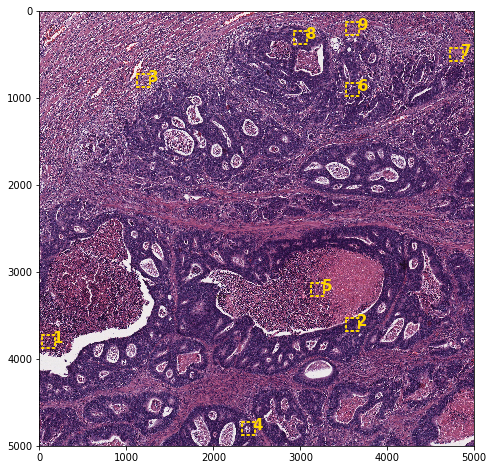

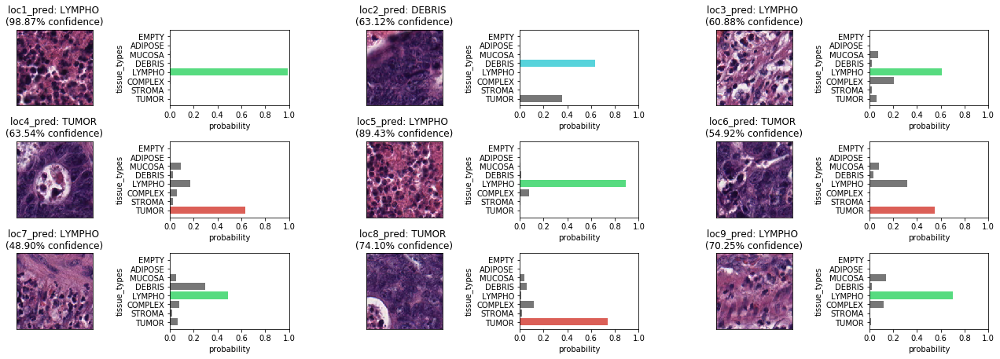

In [33]:
loc_list = [(100,3800), (3600,3600), (1200, 800), (2400, 4800), (3200, 3200), (3600, 900), (4800, 500), (3000, 300), (3600, 200)]
histology_cls_patch(img_paths[1], loc_list)
histology_cls(img_paths[1], loc_list, inception_fc2, tissue_types, device)

# 7. Conclusion and discussion

**Conclusion**: Using pretrained Inception_v3 (convolutional part), adding and training a fully-connected layer with 256 nodes and training the final classifier for H&E images in this dataset can achieve an overall accuracy of 89.867% across 8 different tissue types:
  * 0: `01_TUMOR` -- 89.77%
  
  * 1: `02_STROMA` -- 82.93%
  
  * 2: `03_COMPLEX` -- 83.16%
  
  * 3: `04_LYMPHO` -- 84.04%
  
  * 4: `05_DEBRIS` -- 89.00%
  
  * 5: `06_MUCOSA` -- 93.75%
  
  * 6: `07_ADIPOSE` -- 94.85%
  
  * 7: `08_EMPTY` -- 100.00%


1.The model is very good at classifying classes that show a distinct pixel distribution pattern such as `ADIPOSE` and `EMPTY`. 


2.The prediction accuracy for `STROMA` and `COMPLEX` classes is relatively low and based on the confusion matrix, a large proportion of misclassified images in these two classes fall into the other class. Considering the definition of `STROMA` and `COMPLEX` classes (both are stroma), it's understandable that it's difficult to classify between these two classes.


3.One caveat of this prediction approach is that the prediction is based on a defined area of 150x150px, and it's possible that a certain area contains multiple different types of cells/tissues. For example, it's well known that tumor-immune / tumor-stroma interactions play important functions in tumor progression. Mucosa itself contains immune cells and multiple other cell types. It's obvious in the `Application` section when the trained model is applied to randomly cropped areas from a larger image, some areas actually contain multiple types of cells/tissue and it's very arbitary to assign them to a specific category.


4.One solution is to use a broader classification criterion instead of trying to fine-tune the tissue categories to 8 different classes. Classes such as `STROMA` and `COMPLEX` can be combined. In addition, attention should be paid to selecting images for the training and validation datasets that images with multiple cell types should be eliminated to avoid potential misclassification. 


5.Another approach is to use instance segmentation to provide a more accurate boundary separation of different tissue types. 